In [9]:
# Read Hazards and Impacts (annual input data)
import os
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
def read_data(agg_type):
    agg_type=str(agg_type)
    # Get the current file directory (where the notebook is running)
    current_dir = os.getcwd()
    # Navigate to the root of the repository (adjust based on your directory structure)
    repo_root = os.path.abspath(os.path.join(current_dir, '..'))  # Or adjust the number of ".." as needed
    # Define the paths dynamically
    hazard_folder=  os.path.join(repo_root, "Hazard data")
    impact_folder= os.path.join(repo_root, "Impact data")
    hazard=pd.read_csv(os.path.join(hazard_folder, 'Merged_hazards_noconv_'+agg_type+'.csv'))
    impact=pd.read_csv(os.path.join(impact_folder, 'Merged_impacts_anomalies_nofilter.csv'))
    hazard['Time']=hazard['Time'].astype(int) # yearly data
    impact['Time']=impact['Time'].astype(int) # yearly data
    impact = impact.drop('Unnamed: 0', axis=1)
    #impact[impact['Value']==0]=np.nan
    impact['Type']='impact'
    hazard['Type']='hazard'
    data=hazard.copy()
    data = pd.concat([data, impact], ignore_index=True)
    data=data[data['Time']>=2005] # Restrict all dataset to study period
    data=data[data['Time']<=2022]
    return data


In [ ]:
# Import functions for anomaly calculation
import numpy as np
#from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from shapely.geometry import Polygon
from cartopy.io import shapereader
import cartopy.io.img_tiles as cimgt
import cartopy.crs as ccrs
import geopandas
import pandas as pd
import geopandas as gpd
from scipy.interpolate import griddata
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
import matplotlib.ticker as ticker
from rasterstats import zonal_stats
import rasterio

def anomaly2(t, y, impact_variable, degree):
    # Fit polynomial regression
    tn = mdates.date2num(t)
    X = np.array(tn).reshape(-1, 1)
    y = np.array(y)

    polynomial_features = PolynomialFeatures(degree=degree)
    X_poly = polynomial_features.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)

    # Expected variable using polynomial regression
    y_trend = model.predict(X_poly)

    # Calculate annual percentages of anomaly
    y_anom = (y-y_trend)/abs(y_trend)*100
    return y_anom

def plot_anomaly2(t, y, impact_variable, degree):
    # Fit polynomial regression
    tn = mdates.date2num(t)
    X = np.array(tn).reshape(-1, 1)
    y = np.array(y)

    polynomial_features = PolynomialFeatures(degree=degree)
    X_poly = polynomial_features.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)

    # Expected variable using polynomial regression
    y_trend = model.predict(X_poly)

    # Calculate annual percentages of anomaly
    y_anom = (y-y_trend)/abs(y_trend)*100

    # Plot the results
    plt.plot(pd.to_datetime(t, format='%Y'), y, linestyle='-', color='black', label='Original Data')
    plt.plot(pd.to_datetime(t, format='%Y'), y_trend, linestyle='--', color='blue', label='Polynomial Regression Trend')
    plt.xlabel('Time')
    plt.ylabel(impact_variable)
    plt.legend()
    plt.show()

plt.rcdefaults()
resolution = '50m'
category = 'cultural'
name = 'admin_0_countries'

shpfilename = shapereader.natural_earth(resolution, category, name)
df = gpd.read_file(shpfilename)

# Define the file paths for the shapefiles
current_dir = os.getcwd()
# Navigate to the root of the repository (adjust based on your directory structure)
repo_root = os.path.abspath(os.path.join(current_dir, '..')) 
# Define the paths dynamically
shapefiles_path = os.path.join(repo_root, "Hazard data", "shapefiles")
kommun_file = os.path.join(shapefiles_path,'Kommun_Sweref99TM_region.shp')
# Read the shapefiles using geopandas
kommun_shapefile = gpd.read_file(kommun_file)
kommun_shapefile = kommun_shapefile.to_crs("EPSG:4326")

def plot_map(gdf, col, title, label, lower_bound, upper_bound, vcenter, cmap_type, save, filename):
    st_proj = ccrs.PlateCarree()  # projection used by Stamen images
    ll_proj = ccrs.PlateCarree()  # CRS for raw long/lat
    
    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': st_proj})
    gdf[col]=pd.to_numeric(gdf[col])
    # add geometries to the axes
    #gdf[col] = gdf[col].fillna(0)
    im0 = kommun_shapefile.plot(edgecolor='grey', facecolor='white', linewidth=0.5, legend=False, ax=ax)
    im = gdf.plot(column=col, cmap=cmap_type, 
             vmin=lower_bound, vmax=upper_bound,
             legend=False, ax=ax, 
             legend_kwds={'label': label, 'orientation': 'horizontal'})
    ax.set_title(title, fontsize=14)
    ax.set_extent([11.008164910000085, 24.263413534000115, 55.242678127000055, 69.13635569300011], crs=ll_proj)  # Set your desired extent
    ax.set_aspect('equal', adjustable='box')
    # Specify the shrink parameter to adjust the width of the colorbar
    cbar = plt.colorbar(im.get_children()[1], ax=ax, extend='both', orientation='horizontal', shrink=0.556, pad=0.01)
    # Add a label to the colorbar
    cbar.set_label(label, fontsize=12)
    if save == 'yes':
        fig.savefig(f'figures/{filename}.png', dpi=300, bbox_inches='tight')

    plt.tight_layout()
    plt.show()

In [5]:
# Precalculate all anomalies
data_imp_anom=pd.DataFrame()
# Get the current file directory (where the notebook is running)
current_dir = os.getcwd()
# Navigate to the root of the repository (adjust based on your directory structure)
repo_root = os.path.abspath(os.path.join(current_dir, '..'))  # Or adjust the number of ".." as needed
# Define the paths dynamically
impact_folder= os.path.join(repo_root, "Impact data")
impact=pd.read_csv(os.path.join(impact_folder, 'Merged_impacts.csv'))
trends=['Linear']
impact=impact[impact['Time']>=2005] # Only most recent years (only for all yearly data)
# Pre-calculate anomaly of supply variables (Independent of climate index data)
municipalities= impact['Municipality'].dropna().unique()
impact_variables= ['crop_yield_total', 'discharge', 'hydro_prod']
for impact_variable in impact_variables:
    data_imp= impact[impact['Variable']==impact_variable]
    data_imp['Value'] = pd.to_numeric(data_imp['Value'])
    print(impact_variable)
    for trend in trends:
        print(trend)
        for municipality in municipalities:
            data_imp_mun= data_imp[data_imp['Municipality']==municipality]
            data_imp_mun= data_imp_mun.sort_values('Time', ascending=True)
            data_imp_mun[data_imp_mun['Value']==0]=np.nan # remove data with zeroes (hydro prod for example)
            data_imp_mun=data_imp_mun.dropna(subset='Value')
            y = pd.to_numeric(data_imp_mun['Value'], errors='coerce') # supply variable
            y = y.values
            t = pd.to_numeric(data_imp_mun.Time.values, errors='coerce')
            if len(t)>3:
                if trend=='Linear':
                    y_anom = anomaly2(t, y, impact_variable, 1) # first degree polynomial
            else:
                y_anom=[np.nan for x in t]
            data_imp_mun['Anomalies']=y_anom
            data_imp_mun['Trend']=trend
            data_imp_anom = pd.concat([data_imp_anom, data_imp_mun], ignore_index=True)

crop_yield_total
Linear
discharge
Linear
hydro_prod
Linear


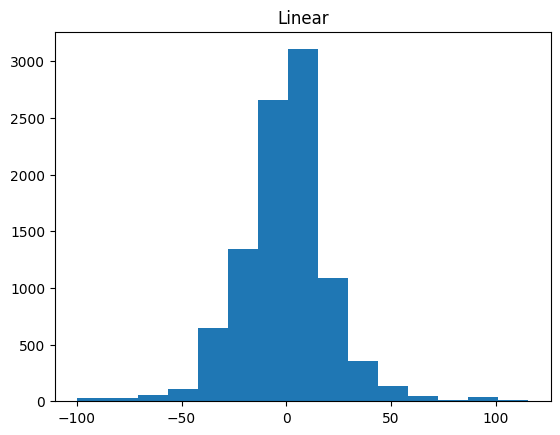

In [7]:
# Plot distribution of all anomalies
trends=['Linear']
filtered_final=pd.DataFrame()
for trend in trends:
    data_check=data_imp_anom[data_imp_anom['Trend']==trend]
    #data_check[data_check['Anomalies']==0]=np.nan
    data_check=data_check.dropna(subset='Anomalies')
    # Remove outliers
    Q1 = data_check['Anomalies'].quantile(0.25)
    Q3 = data_check['Anomalies'].quantile(0.75)
    IQR = Q3 - Q1
    # Calculate lower and upper bounds
    lower_bound = Q1 - 5 * IQR
    upper_bound = Q3 + 5 * IQR
    # Filter out outliers
    data_check = data_check[(data_check['Anomalies'] >= lower_bound) & (data_check['Anomalies'] <= upper_bound)]
    fig, ax = plt.subplots()
    ax.hist(data_check['Anomalies'], bins=15)
    ax.set_title(trend)
    #ax.set_xlim([-150, 150])
    filtered_final = pd.concat([filtered_final, data_check], ignore_index=True)

In [8]:
# Save anomalies without filtering
data_imp_anom.to_csv(os.path.join(impact_folder, 'Merged_impacts_anomalies_nofilter.csv'))

In [47]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as mdates
import calendar
from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Plot detrending and anomalies combined 
def plot_combined(trend, t, y, impvar_name, var_unit, window_frac, x, y_anom, x_values, y_pred, params,
                  hazvar_name, municipality, rmse, p, r_squared, agg_type, dw_stat, bp_pvalue):
    # Set font properties
    SIZE_DEFAULT = 12
    SIZE_LARGE = 14
    plt.rc("font", family="Arial")  # controls default font
    plt.rc("font", weight="normal")  # controls default font
    plt.rc("font", size=SIZE_DEFAULT)  # controls default text sizes
    plt.rc("axes", titlesize=SIZE_LARGE)  # fontsize of the axes title
    plt.rc("axes", labelsize=SIZE_LARGE)  # fontsize of the x and y labels
    plt.rc("xtick", labelsize=SIZE_DEFAULT)  # fontsize of the tick labels
    plt.rc("ytick", labelsize=SIZE_DEFAULT)  # fontsize of the tick labels

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4.5), dpi=300)

    # Define a color palette
    colors = ["#2B2F42", "#8D99AE", "#EF233C"]

    if trend == 'Linear':
        tn = mdates.date2num(t)
        X = np.array(tn).reshape(-1, 1)
        y = np.array(y)
        polynomial_features = PolynomialFeatures(degree=1)
        X_poly = polynomial_features.fit_transform(X)
        model = LinearRegression()
        model.fit(X_poly, y)
        # Expected variable using polynomial regression
        y_trend = model.predict(X_poly)
        # Calculate annual percentages of anomaly
        y_anom = (y - y_trend) / abs(y_trend) * 100

    # Plot original data and trend on ax1
    ax1.scatter(pd.to_datetime(t, format='%Y'), y, color='black', label='Original Data', s=50)
    ax1.plot(pd.to_datetime(t, format='%Y'), y_trend, linestyle='--', color='blue', label=trend + ' Trend', linewidth=2)

    # Hide unnecessary spines
    ax1.spines["right"].set_visible(False)
    ax1.spines["top"].set_visible(False)

    # Set labels and title
    ax1.set_xlabel('Time', fontsize=SIZE_LARGE)
    ax1.set_ylabel(f'{impvar_name}, {var_unit}', fontsize=SIZE_LARGE)
    ax1.set_title(f'{municipality} Municipality', fontsize=SIZE_LARGE)
    ax1.legend(fontsize=SIZE_DEFAULT)
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax1.tick_params(axis='both', which='major', labelsize=SIZE_DEFAULT)
    ax1.grid(False)

    # Plot the model and anomalies against hazard index on ax2
    ax2.scatter(x, y_anom, color='black', label='Original Data', s=50)
    model_str = (
        f'{params[0]:.2f}$I^3$ '
        f'{"+" if params[1] >= 0 else "-"} {abs(params[1]):.2f}$I^2$ '
        f'{"+" if params[2] >= 0 else "-"} {abs(params[2]):.2f}$I$ '
        f'{"+" if params[3] >= 0 else "-"} {abs(params[3]):.2f}')
    ax2.plot(x_values, y_pred, color=colors[2], label=model_str, linewidth=2)

    # Hide unnecessary spines
    ax2.spines["right"].set_visible(False)
    ax2.spines["top"].set_visible(False)

    # Set labels and title
    ax2.set_xlabel(f'Yearly maxima {hazvar_name} of {calendar.month_name[agg_type]} calendar months', fontsize=SIZE_LARGE)
    ax2.set_ylabel(f'{impvar_name} anomaly (%)', fontsize=SIZE_LARGE)
    ax2.set_ylim([-30, 100])
    ax2.set_title(f'{municipality} Municipality', fontsize=SIZE_LARGE)

    # Add text box with statistics
    dw_result = "No autocorrelation" if 1.5 <= dw_stat <= 2.5 else "Autocorrelation detected"
    bp_result = "No heteroskedasticity" if bp_pvalue > 0.05 else "Heteroskedasticity detected"
    textstr = (
        f'$R^2$: {r_squared:.2f}, RMSE: {rmse:.2f}%\np: {p:.5f}\n'
        f'Durbin–Watson: {dw_stat:.2f} ({dw_result})\n'
        f'Breusch–Pagan p: {bp_pvalue:.3f} ({bp_result})'
    )

    handles, labels = ax2.get_legend_handles_labels()
    labels.append(textstr)
    handles.append(plt.Line2D([0], [0], color='none'))  # Dummy handle
    ax2.legend(handles, labels, fontsize=SIZE_DEFAULT)
    ax2.tick_params(axis='both', which='major', labelsize=SIZE_DEFAULT)
    ax2.grid(False)

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.savefig('fig_example.svg', dpi=300)
    plt.savefig('fig_example.pdf', dpi=300)
    plt.savefig('fig_example.eps', dpi=300)
    plt.show()


In [43]:
# Model fitting per municipality 
from tqdm import tqdm_notebook as tqdm
import warnings
from sklearn.metrics import r2_score, mean_squared_error
from scipy.optimize import curve_fit
from scipy.stats import f
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
import statsmodels.api as sm
import sys

# Define fitting model function
def poly_model(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d # third order polynomial model

impact_info=pd.read_excel('Variable List.xlsx','Impact')
hazard_info=pd.read_excel('Variable List.xlsx', 'Hazard')

# Ignore all warnings
warnings.filterwarnings('ignore')
from scipy.stats import pearsonr, linregress
import numpy as np
alpha=0.0 # R-squared threshold
c_alpha=1 # plotting alpha for scatter plots
threshold=-9999 # hazard index minimum threshold
agg_type=1 # monthly aggregation
data=read_data(agg_type)
#data = data.drop(columns=['Unnamed: 0.1'])
municipalities= data['Municipality'].unique()
# Set the parameter bounds
lower_bounds = [-10, -10, -10, -10]
upper_bounds = [10, 10, 10, 10]

def correlations(data, impact_variable, hazard_variable, threshold, trend, agg_type):
    all_count_df=pd.DataFrame()
    #all_data_pair_mun=pd.DataFrame()
    all_saved_data= pd.DataFrame()
    print(impact_variable)
    # Read impact variable data
    mun_total=impact_info[impact_info['var']==impact_variable]['Municipalities Covered'].values[0]
    var_unit=impact_info[impact_info['var']==impact_variable]['Converted Unit'].values[0]
    impvar_name=impact_info[impact_info['var']==impact_variable]['Variable Name'].values[0]
    try:
        hazvar_name=hazard_info[hazard_info['var']==hazard_variable]['Variable Name'].values[0]
    except:
        hazvar_name=hazard_variable
    print(hazard_variable)
    data_haz= data[data['Variable']==hazard_variable]
    data_haz = data_haz.drop(columns=['Anomalies', 'Trend'])
    data_haz['Value'] = pd.to_numeric(data_haz['Value'])
    
    if hazard_variable=='SPEI12':
        data_haz[data_haz['Value']>threshold]=np.nan # Apply threshold
    else:    
        data_haz[data_haz['Value']<threshold]=np.nan # Apply threshold
    data_haz=data_haz.replace(-np.inf, pd.NA).dropna(subset='Value') # remove missing data
    data_haz=data_haz.replace(np.inf, pd.NA).dropna(subset='Value') # remove missing data
    data_imp= data[data['Variable']==impact_variable]
    data_imp['Value'] = pd.to_numeric(data_imp['Value'])
    municipalities= data_imp['Municipality'].dropna().unique()
    data_imp= data_imp[data_imp['Trend']==trend]
    data_pair=data_imp.merge(data_haz, on=['Time','Municipality'])

    # Find correlations at each municipality
    corrs=[]
    pvalues=[]
    all_obs=[]
    all_pre=[]
    a_coeff=[]
    b_coeff=[]
    c_coeff=[]
    d_coeff=[]
    muns=[]
    corr_df=pd.DataFrame(columns=['Municipality', 'Correlation', 'Aggregation'])
    count_df=pd.DataFrame(columns=['Impact variable', 'Hazard variable', 'Count', 'Significance %','Threshold', 'Trend', 'Trend Parameter'])
    count_sig=0
    r2_med=np.nan
    p_value=np.nan
    with tqdm(total=(len(municipalities))) as pbar:
        for municipality in municipalities:
            #print(municipality)
            saved_data= pd.DataFrame()
            data_pair_mun= data_pair[data_pair['Municipality']==municipality]
            data_pair_mun= data_pair_mun.sort_values('Time', ascending=True)
            y = pd.to_numeric(data_pair_mun['Value_x'], errors='coerce') # impact variable
            y[y==0]=np.nan # remove data with zeroes (hydro prod for example)
            x = pd.to_numeric(data_pair_mun['Value_y'], errors='coerce') # hazard variable
            y_anom = data_pair_mun.Anomalies.values
            selected_indices = np.where((~np.isnan(x)) & (~np.isinf(x)) & (~np.isnan(y_anom)) & (~np.isinf(y_anom)))
            y = y.values[selected_indices]
            x = x.values[selected_indices]
            t = data_pair_mun.Time.values[selected_indices] # time variable
            y_anom = y_anom[selected_indices]
            if len(t)>3:
                params, covariance = curve_fit(poly_model, x, y_anom, bounds=(lower_bounds, upper_bounds))
                a, b, c, d= params
                # Generate x values to cover the entire range
                x_values = np.linspace(min(x), max(x), 100)
                # Make predictions on all x values
                y_pred = poly_model(x_values, *params)
                # Calculate R-squared and p-value
                r_squared = r2_score(y_anom, poly_model(x, *params))
                mse = mean_squared_error(y_anom, poly_model(x, *params))
                rmse = np.sqrt(mse)
                # Number of data points
                n = len(x)
                # Number of parameters in the model
                k = len(params)
                # Residual sum of squares
                y_pred2 = poly_model(x, *params)
                RSS = np.sum((y_anom - y_pred2) ** 2)
                # Calculate sum of squares due to regression (SSR) and error (SSE)
                y_mean = np.mean(y_anom)
                #y_pred = poly_model(x, *params)
                SSR = np.sum((y_pred2 - y_mean) ** 2)  # Explained variance
                SSE = np.sum((y_anom - y_pred2) ** 2)  # Unexplained variance
                # Model degrees of freedom and residual degrees of freedom
                p = 3  # Number of predictors: a, b, and c (excluding intercept)
                n = len(y_anom)
                # F-statistic
                F_stat = (SSR / p) / (SSE / (n - p - 1))
                # Compute the p-value using the F-distribution
                p_value = 1 - f.cdf(F_stat, dfn=p, dfd=n - p - 1)
                # --- Diagnostic Tests ---
                residuals = y_anom - y_pred2
                
                # Durbin-Watson test for autocorrelation
                dw_stat = durbin_watson(residuals)
                print(f'Durbin-Watson stat for {municipality}: {dw_stat:.3f}')
                
                # Breusch-Pagan test for heteroskedasticity
                X_bp = np.column_stack((x**3, x**2, x, np.ones_like(x)))  # same terms as model
                _, pval_bp, _, _ = het_breuschpagan(residuals, X_bp)
                print(f'Breusch-Pagan p-value for {municipality}: {pval_bp:.3f}')

                # Thresholds for diagnostics
                dw_threshold_low = 1.5
                dw_threshold_high = 2.5
                bp_pvalue_threshold = 0.05

                # Diagnostic flags
                is_significant = p_value <= 0.05
                has_no_autocorrelation = dw_stat >= dw_threshold_low and dw_stat <= dw_threshold_high
                has_no_heteroskedasticity = pval_bp >= bp_pvalue_threshold

                # Print diagnostic messages
                if is_significant:
                    print(f"[{municipality}] The model is statistically significant (good).")
                else:
                    print(f"[{municipality}] The model is NOT statistically significant (bad).")

                if has_no_autocorrelation:
                    print(f"[{municipality}] Residuals have NO significant autocorrelation (good).")
                else:
                    print(f"[{municipality}] Residuals HAVE significant autocorrelation (bad).")

                if has_no_heteroskedasticity:
                    print(f"[{municipality}] Residuals have NO significant heteroskedasticity (good).")
                else:
                    print(f"[{municipality}] Residuals HAVE significant heteroskedasticity (bad).")

                # Combine checks to decide if result should be saved
                if not (is_significant and has_no_autocorrelation and has_no_heteroskedasticity):
                    r_squared = np.nan  # unreliable model
                else:
                    count_sig += 1
                    plot_combined(trend, t, y, impvar_name, var_unit, window_frac, x, y_anom, x_values, y_pred, params, hazvar_name, municipality, rmse, p_value, r_squared, agg_type, dw_stat, pval_bp)
                saved_data['Time']=t
                saved_data['Municipality']=municipality
                saved_data['Impact variable']=impact_variable
                saved_data['Hazard variable']=hazard_variable
                saved_data['Impact value']=y
                saved_data['Hazard value']=x
                saved_data['Trend']=trend
                saved_data['Observed anomalies']=y_anom
                saved_data['Predicted anomalies']=y_pred2
                saved_data['Aggregation']=agg_type
            else:
                r_squared = 0
                y_anom = np.nan
                y_pred2 = np.nan
                p_value = np.nan
                a= np.nan
                b= np.nan
                c= np.nan
                d= np.nan
            all_obs.append(y_anom)
            all_pre.append(y_pred2)
            muns.append(municipality)
            corrs.append(r_squared)
            pbar.update(1)
            d_coeff.append(d)
            c_coeff.append(c)
            b_coeff.append(b)
            a_coeff.append(a)
            pvalues.append(p_value)
            all_saved_data = pd.concat([all_saved_data, saved_data], ignore_index=True)
        counts=count_sig
        # Correlation df: information for each municipality
        corr_df['Municipality']=muns
        corr_df['Correlation']=corrs
        corr_df['p']=pvalues
        corr_df['Aggregation']=agg_type
        corr_df['Trend']=trend
        corr_df['Impact variable']=impact_variable
        corr_df['Hazard variable']=hazard_variable
        corr_df['A']=a_coeff
        corr_df['B']=b_coeff
        corr_df['C']=c_coeff
        corr_df['D']=d_coeff
        corrs=np.array(corrs)
        r2_avg=np.nanmean(corrs[corrs>0])
        r2_med=np.nanmedian(corrs[corrs>0])
        count_df['Count']=[counts]
        count_df['Impact variable']=impact_variable
        count_df['Hazard variable']=hazard_variable
        count_df['Significance %']=np.round(count_sig/mun_total*100,2)
        count_df['Mean R2']=r2_avg
        count_df['Threshold']=threshold
        count_df['Trend']=trend
        count_df['Aggregation']=agg_type
        print(count_df)
        all_count_df = pd.concat([all_count_df, count_df], ignore_index=True)
    return corr_df, all_count_df, np.round(r2_avg,2), np.round(r2_med,2), count_sig, all_saved_data

import matplotlib.colors as mcolors
import matplotlib.cm as cm

def plot_map_months(gdf, col, title, label, lower_bound, upper_bound, vcenter, cmap_type, save, filename):
    st_proj = ccrs.PlateCarree()  # projection used by Stamen images
    ll_proj = ccrs.PlateCarree()  # CRS for raw long/lat
    
    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={'projection': st_proj})
    gdf[col] = pd.to_numeric(gdf[col])
    
    # Define your custom qualitative colormap for months
    month_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#ff00ff', '#00ffff']
    month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    #month_cmap = mcolors.ListedColormap(month_colors, name='month_cmap')
    month_cmap = cm.get_cmap('twilight', 12)    # 12 discrete colors
    
    month_bounds = np.linspace(1.5, 12.5, 12)  # Adjusted boundaries for each color segment
    #month_bounds = np.arange(1, 13)
    
    im0 = kommun_shapefile.plot(edgecolor='grey', facecolor='white', linewidth=0.5, legend=False, ax=ax)
    im = gdf.plot(column=col, cmap=month_cmap, 
             vmin=lower_bound, vmax=upper_bound,
             legend=False, ax=ax)
    
    # Create a ScalarMappable with the same colormap and bounds
    sm = cm.ScalarMappable(cmap=month_cmap, norm=plt.Normalize(vmin=lower_bound, vmax=upper_bound))
    sm.set_array([])  # this line may be necessary depending on your matplotlib version
    
    # Create a colorbar with month labels
    cbar = plt.colorbar(sm, ax=ax, ticks=month_bounds, orientation='horizontal', shrink=0.556, pad=0.01)
    cbar.ax.set_xticklabels(month_names)
    cbar.set_label(label, fontsize=12)

    ax.set_title(title, fontsize=14)
    ax.set_extent([11.008164910000085, 24.263413534000115, 55.242678127000055, 69.13635569300011], crs=ll_proj)  # Set your desired extent
    ax.set_aspect('equal', adjustable='box')

    if save == 'yes':
        fig.savefig(f'figures/{filename}.png', dpi=300, bbox_inches='tight')

    plt.tight_layout()
    plt.show()     

Hazard variable: SPEI12
Impact variable: hydro_prod
Aggregation type: 9
Threshold type: none
Trend: Linear
Threshold: nan
hydro_prod
SPEI12


  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.120
Breusch-Pagan p-value for Alingsås: 0.404
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.226
Breusch-Pagan p-value for Bengtsfors: 0.338
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.560
Breusch-Pagan p-value for Bollebygd: 0.725
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocorrelation (good).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.925
Breusch-Pagan p-value for Borås: 0.329
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO signi

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


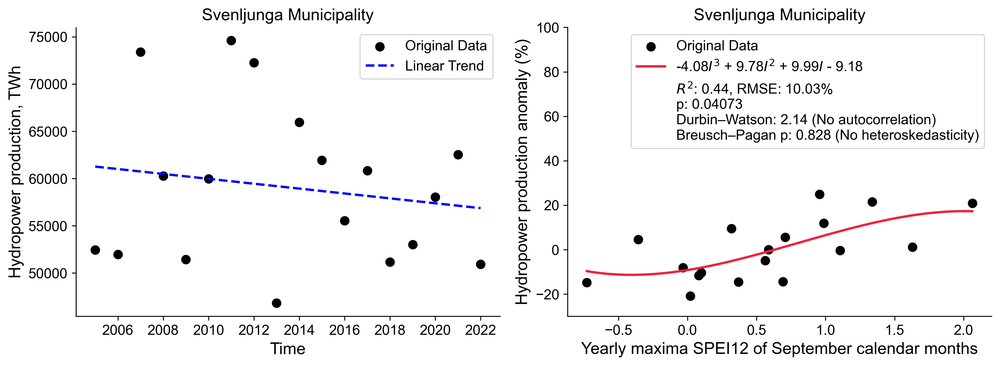

Durbin-Watson stat for Tibro: 0.492
Breusch-Pagan p-value for Tibro: 0.828
[Tibro] The model is NOT statistically significant (bad).
[Tibro] Residuals HAVE significant autocorrelation (bad).
[Tibro] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Tidaholm: 1.050
Breusch-Pagan p-value for Tidaholm: 0.522
[Tidaholm] The model is NOT statistically significant (bad).
[Tidaholm] Residuals HAVE significant autocorrelation (bad).
[Tidaholm] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Tranemo: 1.400
Breusch-Pagan p-value for Tranemo: 0.463
[Tranemo] The model is NOT statistically significant (bad).
[Tranemo] Residuals HAVE significant autocorrelation (bad).
[Tranemo] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Trollhättan: 1.103
Breusch-Pagan p-value for Trollhättan: 0.536
[Trollhättan] The model is NOT statistically significant (bad).
[Trollhättan] Residuals HAVE significant autocorrelation

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


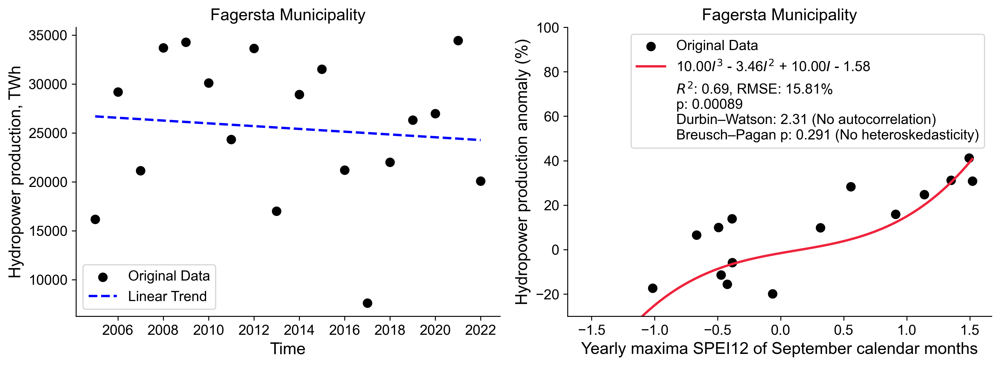

Durbin-Watson stat for Hallstahammar: 2.604
Breusch-Pagan p-value for Hallstahammar: 0.296
[Hallstahammar] The model is statistically significant (good).
[Hallstahammar] Residuals HAVE significant autocorrelation (bad).
[Hallstahammar] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Kungsör: 2.628
Breusch-Pagan p-value for Kungsör: 0.507
[Kungsör] The model is statistically significant (good).
[Kungsör] Residuals HAVE significant autocorrelation (bad).
[Kungsör] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Köping: 2.700
Breusch-Pagan p-value for Köping: 0.333
[Köping] The model is statistically significant (good).
[Köping] Residuals HAVE significant autocorrelation (bad).
[Köping] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Norberg: 0.742
Breusch-Pagan p-value for Norberg: 0.226
[Norberg] The model is NOT statistically significant (bad).
[Norberg] Residuals HAVE significant autocorrel

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


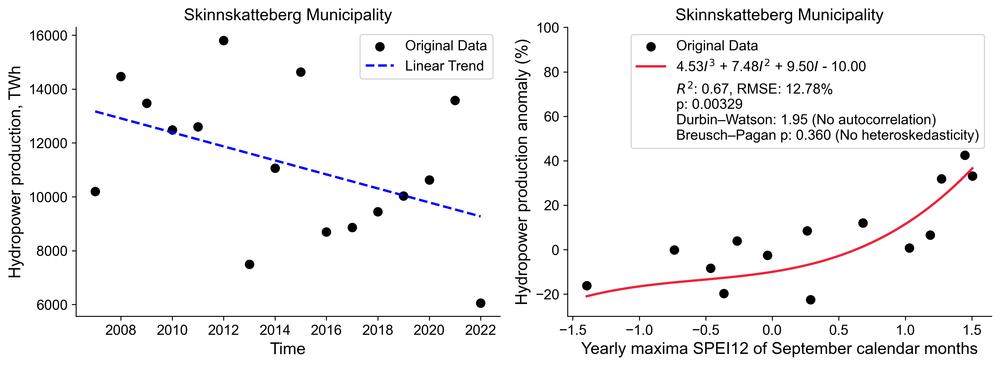

Durbin-Watson stat for Surahammar: 2.004
Breusch-Pagan p-value for Surahammar: 0.260
[Surahammar] The model is NOT statistically significant (bad).
[Surahammar] Residuals have NO significant autocorrelation (good).
[Surahammar] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Västerås: 1.634
Breusch-Pagan p-value for Västerås: 0.727
[Västerås] The model is NOT statistically significant (bad).
[Västerås] Residuals have NO significant autocorrelation (good).
[Västerås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Arvika: 1.340
Breusch-Pagan p-value for Arvika: 0.514
[Arvika] The model is NOT statistically significant (bad).
[Arvika] Residuals HAVE significant autocorrelation (bad).
[Arvika] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Eda: 2.565
Breusch-Pagan p-value for Eda: 0.380
[Eda] The model is NOT statistically significant (bad).
[Eda] Residuals HAVE significant autocorrelation (ba

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


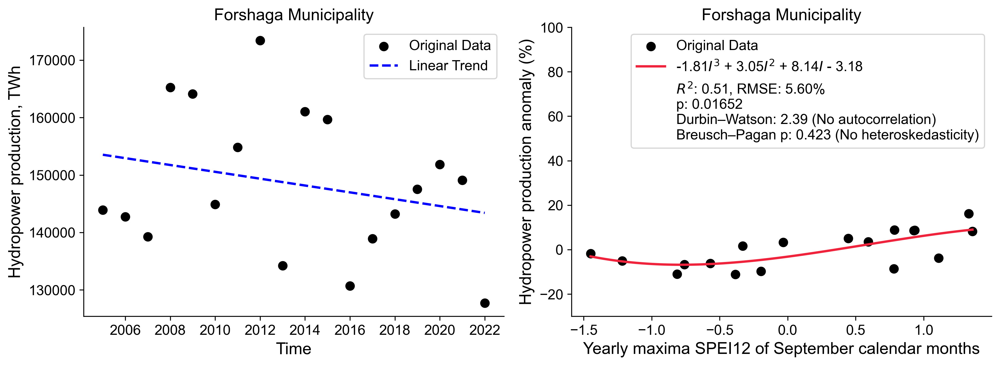

Durbin-Watson stat for Hagfors: 1.641
Breusch-Pagan p-value for Hagfors: 0.782
[Hagfors] The model is statistically significant (good).
[Hagfors] Residuals have NO significant autocorrelation (good).
[Hagfors] Residuals have NO significant heteroskedasticity (good).


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


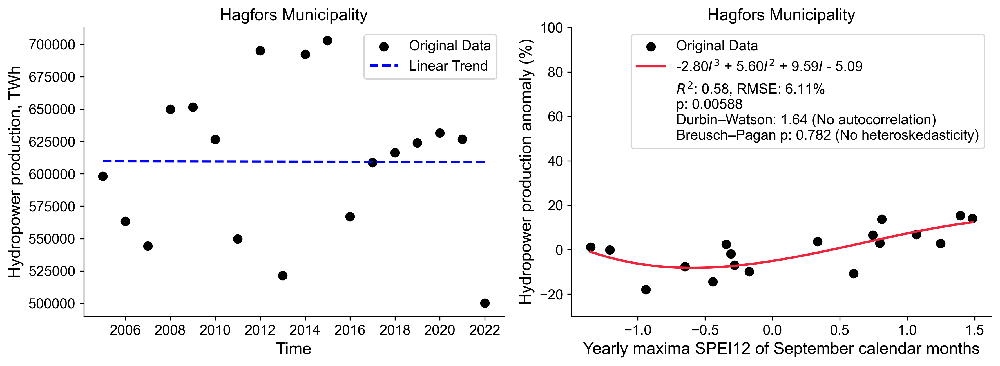

Durbin-Watson stat for Karlstad: 1.475
Breusch-Pagan p-value for Karlstad: 0.624
[Karlstad] The model is NOT statistically significant (bad).
[Karlstad] Residuals HAVE significant autocorrelation (bad).
[Karlstad] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Kil: 1.987
Breusch-Pagan p-value for Kil: 0.010
[Kil] The model is statistically significant (good).
[Kil] Residuals have NO significant autocorrelation (good).
[Kil] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Kristinehamn: 2.425
Breusch-Pagan p-value for Kristinehamn: 0.256
[Kristinehamn] The model is NOT statistically significant (bad).
[Kristinehamn] Residuals have NO significant autocorrelation (good).
[Kristinehamn] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Munkfors: 1.452
Breusch-Pagan p-value for Munkfors: 0.775
[Munkfors] The model is NOT statistically significant (bad).
[Munkfors] Residuals HAVE significant autocorrela

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


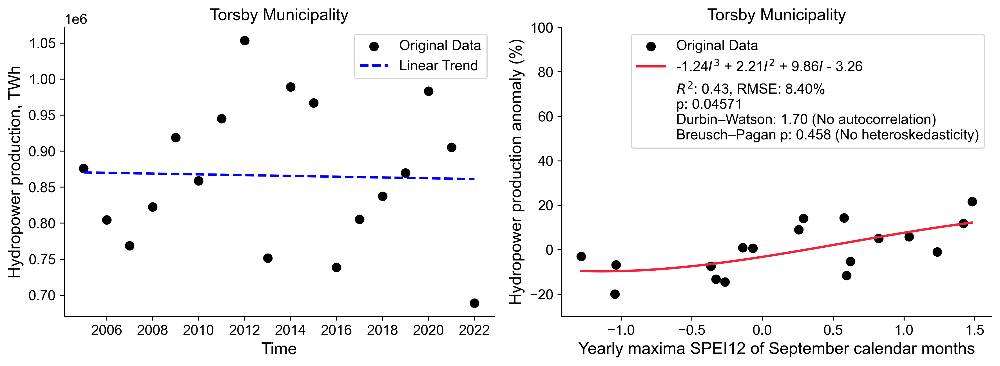

Durbin-Watson stat for Årjäng: 2.241
Breusch-Pagan p-value for Årjäng: 0.342
[Årjäng] The model is NOT statistically significant (bad).
[Årjäng] Residuals have NO significant autocorrelation (good).
[Årjäng] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Askersund: 0.990
Breusch-Pagan p-value for Askersund: 0.921
[Askersund] The model is NOT statistically significant (bad).
[Askersund] Residuals HAVE significant autocorrelation (bad).
[Askersund] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Degerfors: 2.035
Breusch-Pagan p-value for Degerfors: 0.325
[Degerfors] The model is statistically significant (good).
[Degerfors] Residuals have NO significant autocorrelation (good).
[Degerfors] Residuals have NO significant heteroskedasticity (good).


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


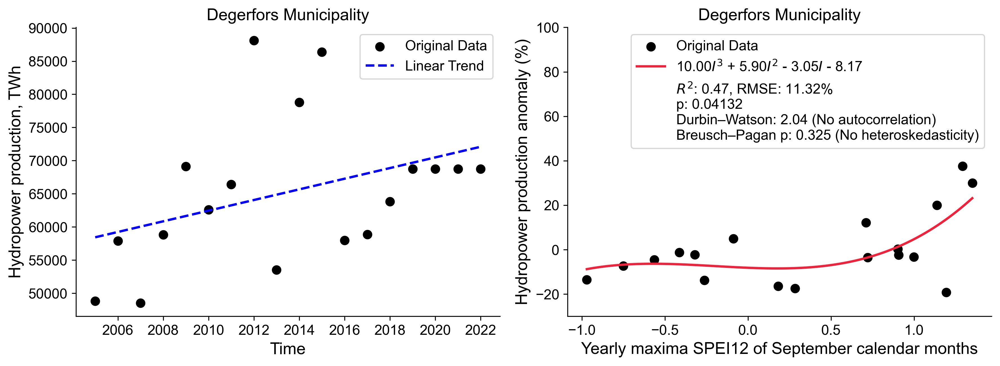

Durbin-Watson stat for Hallsberg: 1.296
Breusch-Pagan p-value for Hallsberg: 0.950
[Hallsberg] The model is NOT statistically significant (bad).
[Hallsberg] Residuals HAVE significant autocorrelation (bad).
[Hallsberg] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Hällefors: 1.284
Breusch-Pagan p-value for Hällefors: 0.461
[Hällefors] The model is NOT statistically significant (bad).
[Hällefors] Residuals HAVE significant autocorrelation (bad).
[Hällefors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Karlskoga: 1.060
Breusch-Pagan p-value for Karlskoga: 0.056
[Karlskoga] The model is NOT statistically significant (bad).
[Karlskoga] Residuals HAVE significant autocorrelation (bad).
[Karlskoga] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Laxå: 1.286
Breusch-Pagan p-value for Laxå: 0.022
[Laxå] The model is NOT statistically significant (bad).
[Laxå] Residuals HAVE significant autocorr

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


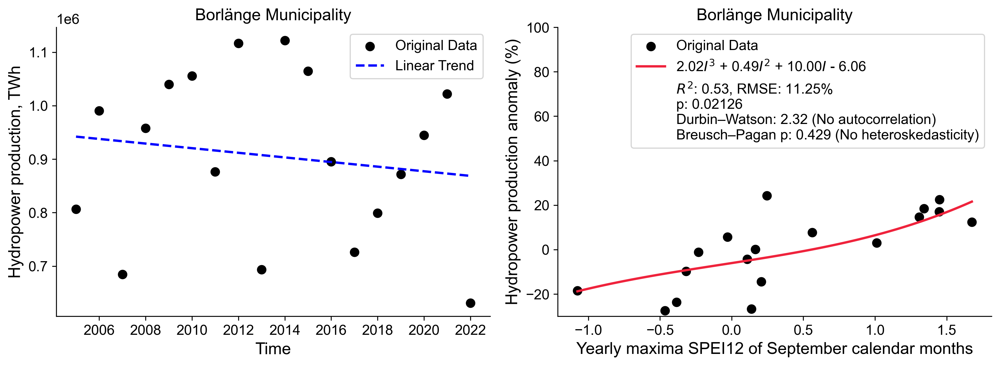

Durbin-Watson stat for Falun: 2.683
Breusch-Pagan p-value for Falun: 0.791
[Falun] The model is statistically significant (good).
[Falun] Residuals HAVE significant autocorrelation (bad).
[Falun] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Gagnef: 2.560
Breusch-Pagan p-value for Gagnef: 0.461
[Gagnef] The model is NOT statistically significant (bad).
[Gagnef] Residuals HAVE significant autocorrelation (bad).
[Gagnef] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Hedemora: 1.115
Breusch-Pagan p-value for Hedemora: 0.171
[Hedemora] The model is NOT statistically significant (bad).
[Hedemora] Residuals HAVE significant autocorrelation (bad).
[Hedemora] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Leksand: 1.989
Breusch-Pagan p-value for Leksand: 0.359
[Leksand] The model is NOT statistically significant (bad).
[Leksand] Residuals have NO significant autocorrelation (good).
[Leksand] Re

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


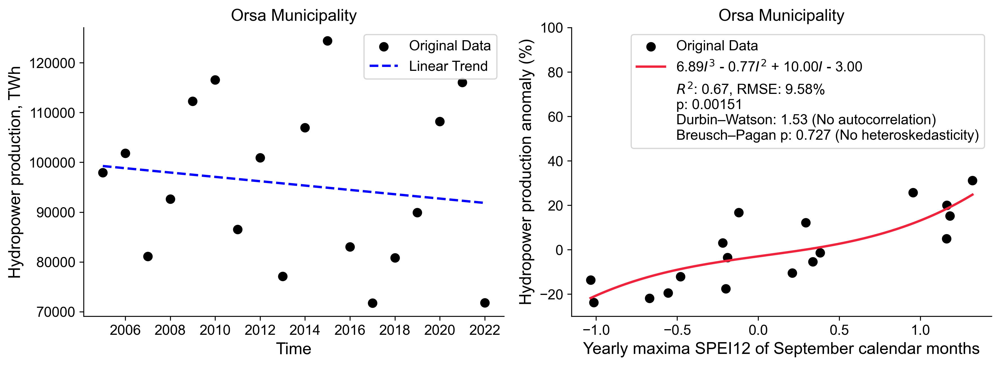

Durbin-Watson stat for Rättvik: 1.235
Breusch-Pagan p-value for Rättvik: 0.279
[Rättvik] The model is NOT statistically significant (bad).
[Rättvik] Residuals HAVE significant autocorrelation (bad).
[Rättvik] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Smedjebacken: 2.186
Breusch-Pagan p-value for Smedjebacken: 0.522
[Smedjebacken] The model is NOT statistically significant (bad).
[Smedjebacken] Residuals have NO significant autocorrelation (good).
[Smedjebacken] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Säter: 1.836
Breusch-Pagan p-value for Säter: 0.206
[Säter] The model is statistically significant (good).
[Säter] Residuals have NO significant autocorrelation (good).
[Säter] Residuals have NO significant heteroskedasticity (good).


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


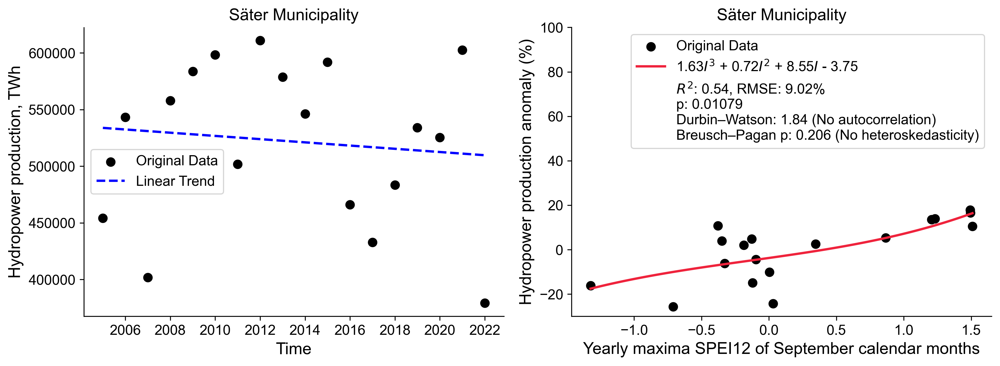

Durbin-Watson stat for Vansbro: 0.859
Breusch-Pagan p-value for Vansbro: 0.233
[Vansbro] The model is NOT statistically significant (bad).
[Vansbro] Residuals HAVE significant autocorrelation (bad).
[Vansbro] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Älvdalen: 2.128
Breusch-Pagan p-value for Älvdalen: 0.470
[Älvdalen] The model is NOT statistically significant (bad).
[Älvdalen] Residuals have NO significant autocorrelation (good).
[Älvdalen] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Hässleholm: 0.497
Breusch-Pagan p-value for Hässleholm: 0.417
[Hässleholm] The model is NOT statistically significant (bad).
[Hässleholm] Residuals HAVE significant autocorrelation (bad).
[Hässleholm] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Klippan: 1.031
Breusch-Pagan p-value for Klippan: 0.985
[Klippan] The model is NOT statistically significant (bad).
[Klippan] Residuals HAVE significant au

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


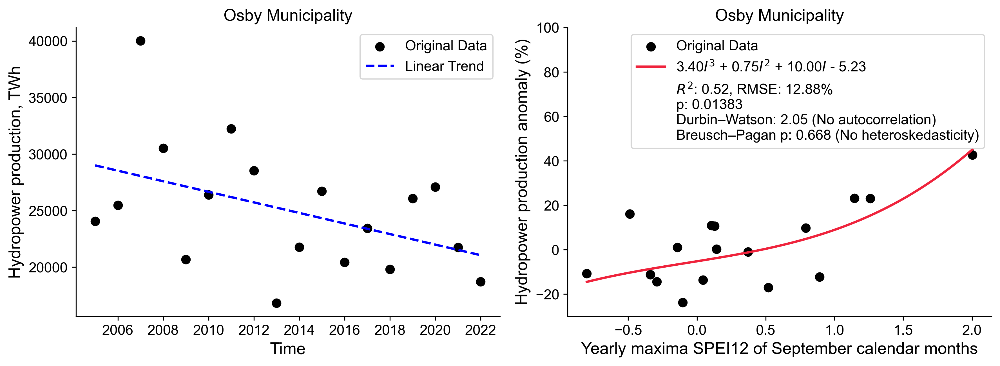

Durbin-Watson stat for Perstorp: 0.469
Breusch-Pagan p-value for Perstorp: 0.235
[Perstorp] The model is NOT statistically significant (bad).
[Perstorp] Residuals HAVE significant autocorrelation (bad).
[Perstorp] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Östra Göinge: 1.517
Breusch-Pagan p-value for Östra Göinge: 0.554
[Östra Göinge] The model is statistically significant (good).
[Östra Göinge] Residuals have NO significant autocorrelation (good).
[Östra Göinge] Residuals have NO significant heteroskedasticity (good).


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


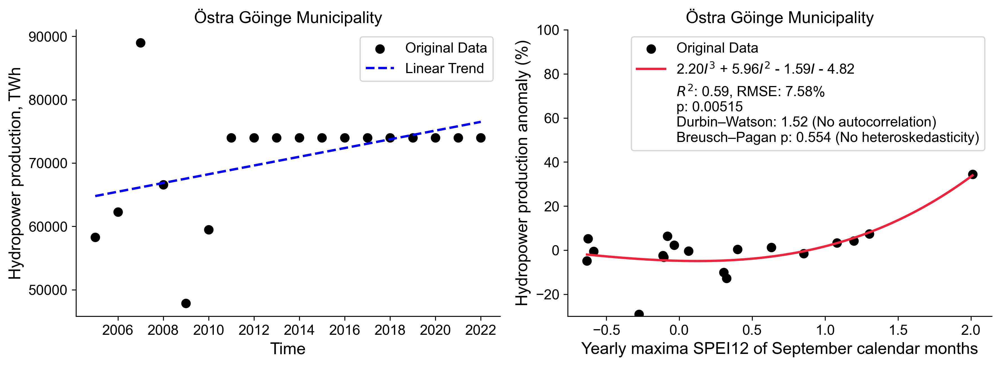

Durbin-Watson stat for Emmaboda: 2.192
Breusch-Pagan p-value for Emmaboda: 0.173
[Emmaboda] The model is NOT statistically significant (bad).
[Emmaboda] Residuals have NO significant autocorrelation (good).
[Emmaboda] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Hultsfred: 1.158
Breusch-Pagan p-value for Hultsfred: 0.587
[Hultsfred] The model is NOT statistically significant (bad).
[Hultsfred] Residuals HAVE significant autocorrelation (bad).
[Hultsfred] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Högsby: 1.168
Breusch-Pagan p-value for Högsby: 0.377
[Högsby] The model is NOT statistically significant (bad).
[Högsby] Residuals HAVE significant autocorrelation (bad).
[Högsby] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Mönsterås: 1.625
Breusch-Pagan p-value for Mönsterås: 0.276
[Mönsterås] The model is NOT statistically significant (bad).
[Mönsterås] Residuals have NO significant a

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


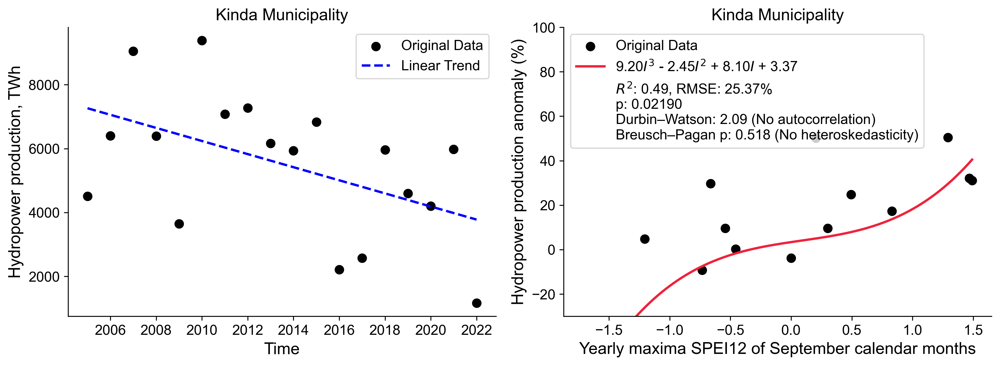

Durbin-Watson stat for Linköping: 1.498
Breusch-Pagan p-value for Linköping: 0.302
[Linköping] The model is NOT statistically significant (bad).
[Linköping] Residuals HAVE significant autocorrelation (bad).
[Linköping] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Mjölby: 1.495
Breusch-Pagan p-value for Mjölby: 0.613
[Mjölby] The model is statistically significant (good).
[Mjölby] Residuals HAVE significant autocorrelation (bad).
[Mjölby] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Motala: 1.255
Breusch-Pagan p-value for Motala: 0.471
[Motala] The model is NOT statistically significant (bad).
[Motala] Residuals HAVE significant autocorrelation (bad).
[Motala] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Norrköping: 0.863
Breusch-Pagan p-value for Norrköping: 0.297
[Norrköping] The model is statistically significant (good).
[Norrköping] Residuals HAVE significant autocorrelation (bad

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


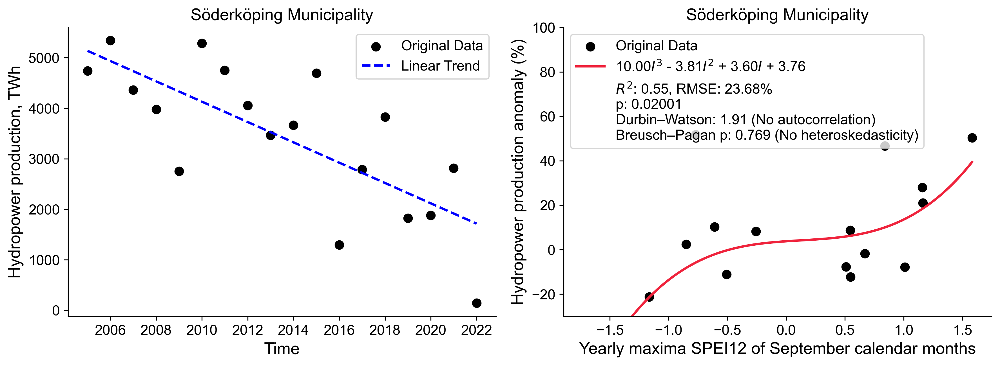

Durbin-Watson stat for Valdemarsvik: 2.227
Breusch-Pagan p-value for Valdemarsvik: 0.772
[Valdemarsvik] The model is NOT statistically significant (bad).
[Valdemarsvik] Residuals have NO significant autocorrelation (good).
[Valdemarsvik] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Ydre: 0.862
Breusch-Pagan p-value for Ydre: 0.184
[Ydre] The model is NOT statistically significant (bad).
[Ydre] Residuals HAVE significant autocorrelation (bad).
[Ydre] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Åtvidaberg: 2.503
Breusch-Pagan p-value for Åtvidaberg: 0.863
[Åtvidaberg] The model is statistically significant (good).
[Åtvidaberg] Residuals HAVE significant autocorrelation (bad).
[Åtvidaberg] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Enköping: 1.903
Breusch-Pagan p-value for Enköping: 0.188
[Enköping] The model is NOT statistically significant (bad).
[Enköping] Residuals have NO signi

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


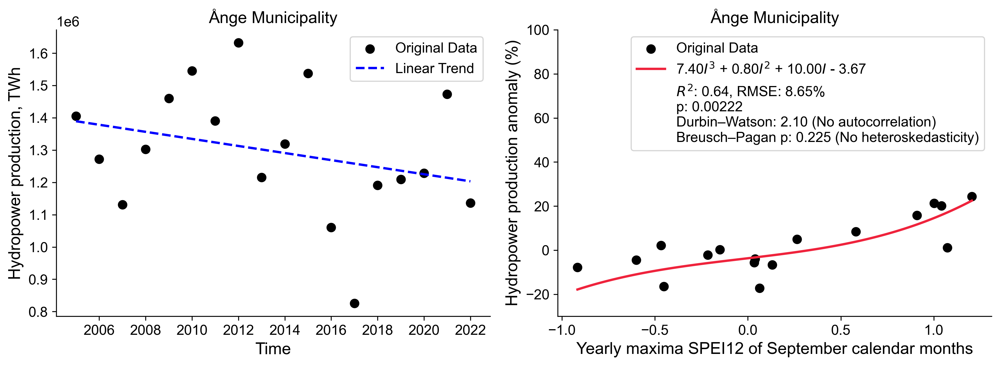

Durbin-Watson stat for Timrå: 2.306
Breusch-Pagan p-value for Timrå: 0.400
[Timrå] The model is NOT statistically significant (bad).
[Timrå] Residuals have NO significant autocorrelation (good).
[Timrå] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Härnösand: 1.968
Breusch-Pagan p-value for Härnösand: 0.628
[Härnösand] The model is NOT statistically significant (bad).
[Härnösand] Residuals have NO significant autocorrelation (good).
[Härnösand] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Sundsvall: 1.243
Breusch-Pagan p-value for Sundsvall: 0.288
[Sundsvall] The model is statistically significant (good).
[Sundsvall] Residuals HAVE significant autocorrelation (bad).
[Sundsvall] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Kramfors: 1.813
Breusch-Pagan p-value for Kramfors: 0.565
[Kramfors] The model is NOT statistically significant (bad).
[Kramfors] Residuals have NO significant auto

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


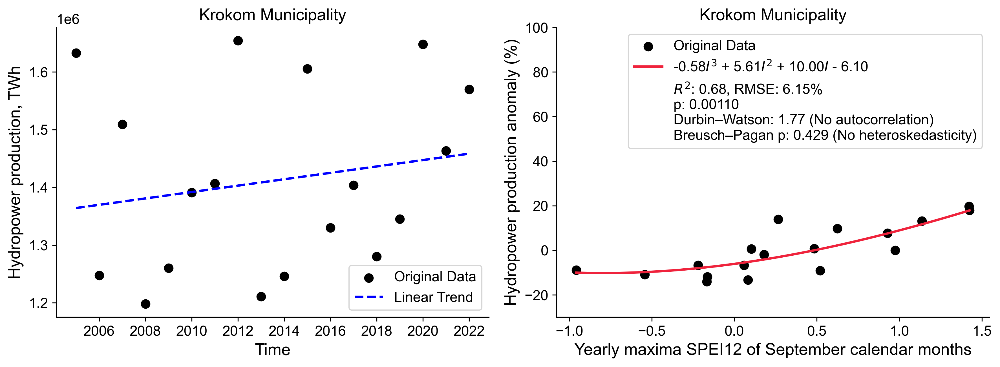

Durbin-Watson stat for Strömsund: 2.205
Breusch-Pagan p-value for Strömsund: 0.542
[Strömsund] The model is statistically significant (good).
[Strömsund] Residuals have NO significant autocorrelation (good).
[Strömsund] Residuals have NO significant heteroskedasticity (good).


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


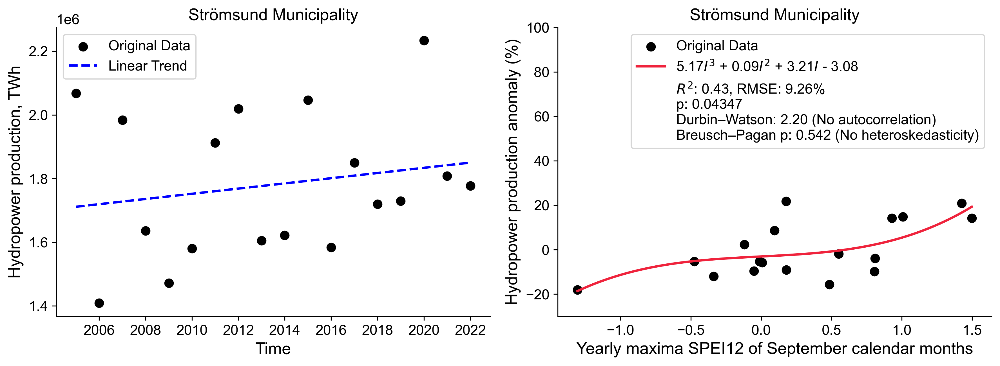

Durbin-Watson stat for Åre: 2.491
Breusch-Pagan p-value for Åre: 0.638
[Åre] The model is NOT statistically significant (bad).
[Åre] Residuals have NO significant autocorrelation (good).
[Åre] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Berg: 2.212
Breusch-Pagan p-value for Berg: 0.428
[Berg] The model is NOT statistically significant (bad).
[Berg] Residuals have NO significant autocorrelation (good).
[Berg] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Härjedalen: 1.858
Breusch-Pagan p-value for Härjedalen: 0.214
[Härjedalen] The model is NOT statistically significant (bad).
[Härjedalen] Residuals have NO significant autocorrelation (good).
[Härjedalen] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Östersund: 3.020
Breusch-Pagan p-value for Östersund: 0.783
[Östersund] The model is NOT statistically significant (bad).
[Östersund] Residuals HAVE significant autocorrelation (bad).
[Ös

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


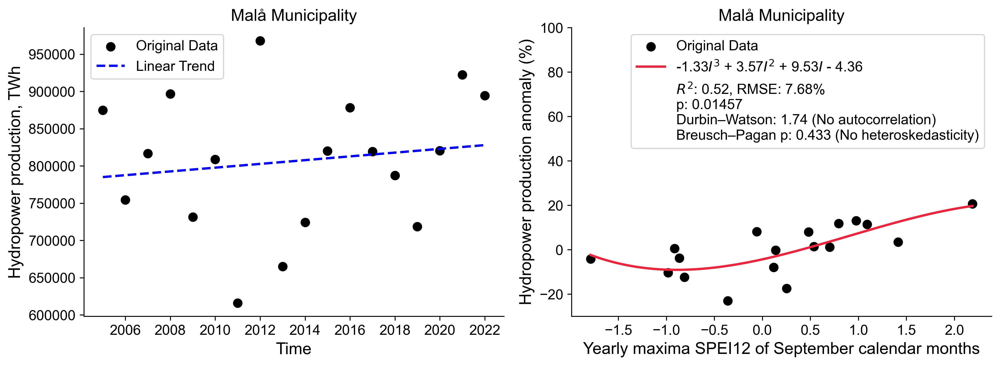

Durbin-Watson stat for Storuman: 1.245
Breusch-Pagan p-value for Storuman: 0.188
[Storuman] The model is statistically significant (good).
[Storuman] Residuals HAVE significant autocorrelation (bad).
[Storuman] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Sorsele: 1.800
Breusch-Pagan p-value for Sorsele: 0.536
[Sorsele] The model is NOT statistically significant (bad).
[Sorsele] Residuals have NO significant autocorrelation (good).
[Sorsele] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Vännäs: 1.354
Breusch-Pagan p-value for Vännäs: 0.514
[Vännäs] The model is NOT statistically significant (bad).
[Vännäs] Residuals HAVE significant autocorrelation (bad).
[Vännäs] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Vilhelmina: 2.018
Breusch-Pagan p-value for Vilhelmina: 0.601
[Vilhelmina] The model is statistically significant (good).
[Vilhelmina] Residuals have NO significant autocorrelati

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


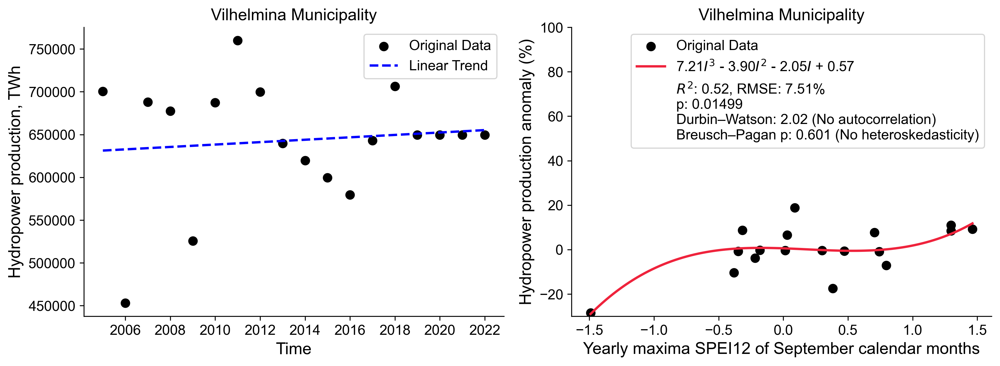

Durbin-Watson stat for Åsele: 1.238
Breusch-Pagan p-value for Åsele: 0.779
[Åsele] The model is NOT statistically significant (bad).
[Åsele] Residuals HAVE significant autocorrelation (bad).
[Åsele] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Umeå: 2.367
Breusch-Pagan p-value for Umeå: 0.482
[Umeå] The model is NOT statistically significant (bad).
[Umeå] Residuals have NO significant autocorrelation (good).
[Umeå] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Lycksele: 2.004
Breusch-Pagan p-value for Lycksele: 0.697
[Lycksele] The model is statistically significant (good).
[Lycksele] Residuals have NO significant autocorrelation (good).
[Lycksele] Residuals have NO significant heteroskedasticity (good).


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


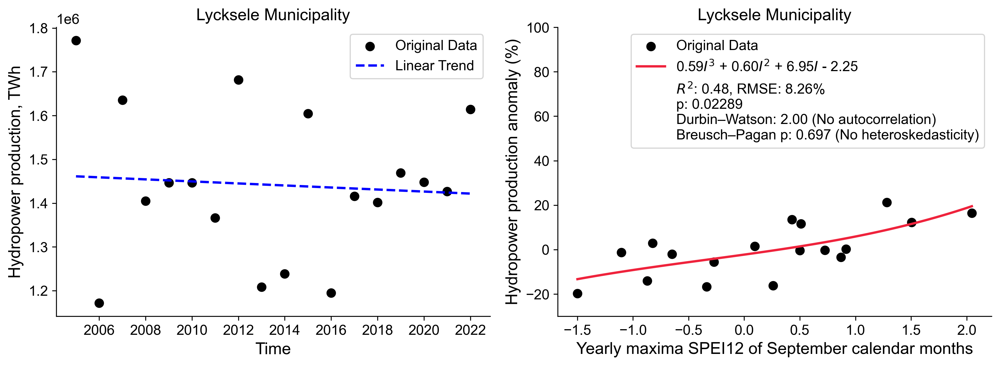

Durbin-Watson stat for Arvidsjaur: 3.067
Breusch-Pagan p-value for Arvidsjaur: 0.639
[Arvidsjaur] The model is NOT statistically significant (bad).
[Arvidsjaur] Residuals HAVE significant autocorrelation (bad).
[Arvidsjaur] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Arjeplog: 2.021
Breusch-Pagan p-value for Arjeplog: 0.405
[Arjeplog] The model is NOT statistically significant (bad).
[Arjeplog] Residuals have NO significant autocorrelation (good).
[Arjeplog] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Övertorneå: 1.245
Breusch-Pagan p-value for Övertorneå: 0.659
[Övertorneå] The model is statistically significant (good).
[Övertorneå] Residuals HAVE significant autocorrelation (bad).
[Övertorneå] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Gällivare: 1.933
Breusch-Pagan p-value for Gällivare: 0.850
[Gällivare] The model is NOT statistically significant (bad).
[Gällivare] Residuals

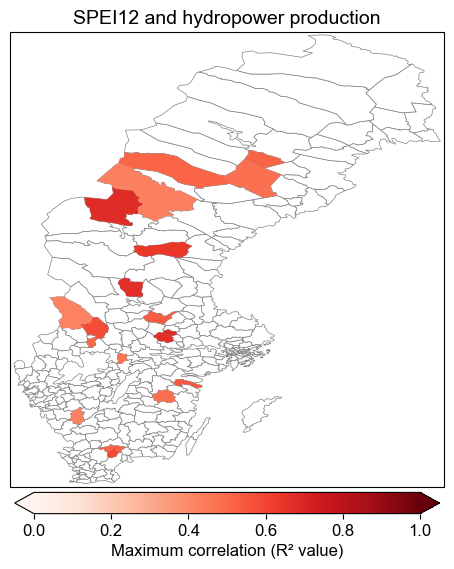

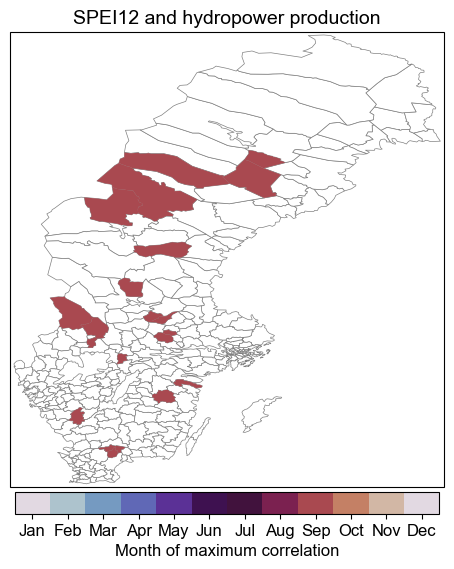

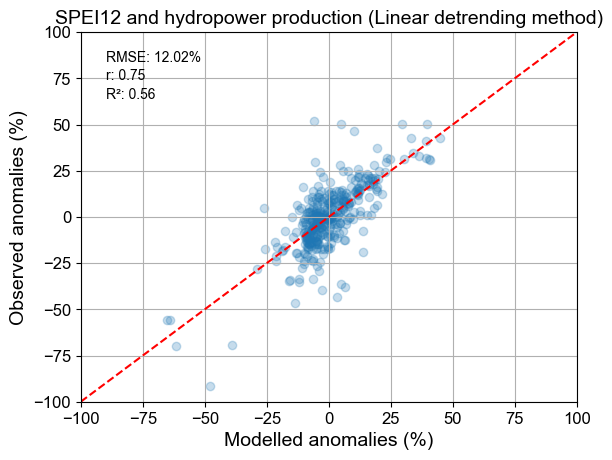

In [48]:
# Example fit
# Check Runs (Drought impacts in hydropower production at different months): 
runs_df=pd.read_excel(r'C:\Users\MarlonVieiraPassos\OneDrive - SEI\Documents\KTH PhD\Thesis Work\Task 2\Data\Variable Runs Municipality.xlsx',
                         'Energy')
runs_df=runs_df.sort_values('hazard_var', ascending=False)
#runs_df=runs_df[runs_df['Threshold']==-9999]
runs_df=runs_df[runs_df['Threshold Type']=='none']
#runs_df=runs_df[runs_df['hazard_var']!='SPEI3']
#runs_df=runs_df[runs_df['hazard_var']=='DFI']
runs_df=runs_df[runs_df['hazard_var']=='SPEI12']
#runs_df=runs_df[runs_df['hazard_var']=='HWI']
#runs_df=runs_df[runs_df['impact_var']=='livestock']
runs_df=runs_df[runs_df['impact_var']=='hydro_prod']
#runs_df=runs_df[runs_df['impact_var']=='crop_yield_total']
all_corr_df=pd.DataFrame()
all_count_df=pd.DataFrame()
all_saved_data=pd.DataFrame()
#trends=['LOWESS']
trends=['Linear']
runs_df['Count']=np.nan
runs_df['Trend']=np.nan
runs_df['Median R2']=np.nan
runs_df['Aggregation']=1
runs_df['Aggregation']=9
runs_no_trend=runs_df.copy()
for trend in trends:
    runs_df_trend=runs_no_trend.copy()
    runs_df_trend['Trend']=trend
    runs_df = pd.concat([runs_df, runs_df_trend], ignore_index=True)

    
runs_df=runs_df.dropna(subset='Trend')
months=[2,3,4,5,6,7,8,9,10,11,12]
months=[]
runs_no_month=runs_df.copy()
for month in months:
    runs_df_month=runs_no_month.copy()
    runs_df_month['Aggregation']=month
    runs_df = pd.concat([runs_df, runs_df_month], ignore_index=True)
#runs_df['Mean Change (%)']=np.nan
#runs_df['Mean Loss (%)']=np.nan
window_frac=0.25 # For LOWESS only
for N in range(len(runs_df)):
    trend= runs_df['Trend'].iloc[N]
    var_imp= runs_df['impact_var'].iloc[N]
    var_haz= runs_df['hazard_var'].iloc[N]
    conversion= runs_df['Conversion'].iloc[N]
    threshold= runs_df['Threshold'].iloc[N]
    t_type= runs_df['Threshold Type'].iloc[N]
    #threshold=0
    agg_type= runs_df['Aggregation'].iloc[N]
    data=read_data(agg_type)
    #agg_type= 'mean'
    print('Hazard variable: '+var_haz)
    print('Impact variable: '+var_imp)
    print('Aggregation type: '+str(agg_type))
    print('Threshold type: '+str(t_type))
    print('Trend: '+str(trend))
    print('Threshold: '+str(threshold))
    corr_df, count_df, mean_r2, median_r2, count, saved_data = correlations(data, var_imp, var_haz, threshold, trend, agg_type)
    runs_df['Mean R2'].iloc[N]=mean_r2
    runs_df['Median R2'].iloc[N]=median_r2
    runs_df['Count'].iloc[N]=count # number of municipality with good results
    all_corr_df = pd.concat([all_corr_df, corr_df], ignore_index=True)
    all_saved_data = pd.concat([all_saved_data, saved_data], ignore_index=True)
    all_count_df = pd.concat([all_count_df, count_df], ignore_index=True)

# Plot graphs of maximum correlations
max_df=pd.DataFrame()
max_df['R2 overall']=np.nan
max_df['RMSE overall']=np.nan
r_squared_list=[]
r_list=[]
p_list=[]
rmse_list=[]
hazvar_list=[]
impvar_list=[]
trend_list=[]
for trend in all_count_df['Trend'].unique():
    for hazvar in all_count_df['Hazard variable'].unique():
        for impvar in all_count_df['Impact variable'].unique():
            hazvar_list.append(hazvar)
            impvar_list.append(impvar)
            trend_list.append(trend)
           # Select all correlations for all municipalities and months by hazard pair and trend type 
            all_corr_df_var=all_corr_df[all_corr_df['Hazard variable']==hazvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Impact variable']==impvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Trend']==trend]
            # Find maximum correlations by month 
            max_corr_agg = all_corr_df_var.groupby(['Municipality','Impact variable', 'Hazard variable', 'Trend']).agg('max').reset_index()
            max_corr_agg = max_corr_agg[max_corr_agg['Correlation']>0]
            # Drop Aggregation Column from max_corr_agg
            max_corr_agg.drop(columns=['Aggregation', 'A', 'B', 'C', 'D', 'p'], inplace=True)
            # Merge max_corr_agg with all_corr_df based on Correlation and Municipality to obtain corresponding Aggregation with maximum correlation
            max_corr_agg = pd.merge(max_corr_agg, all_corr_df, on=['Municipality', 'Impact variable', 'Hazard variable', 'Correlation', 'Trend'], how='left')
            corr_gdf = pd.merge(kommun_shapefile, max_corr_agg, left_on='KnNamn', right_on='Municipality')
            # Next, retrieve yearly impacts based on month with highest correlation 
            max_data= pd.merge(max_corr_agg, all_saved_data, on=['Municipality', 'Impact variable', 'Hazard variable', 'Aggregation', 'Trend'], how='left')
            impvar_name=impact_info[impact_info['var']==impvar]['Variable Name'].values[0]
            hazvar_name=hazard_info[hazard_info['var']==hazvar]['Variable Name'].values[0]
            title= hazvar_name +' and ' + impvar_name.lower()
            plot_map(corr_gdf, 'Correlation', title, 'Maximum correlation (R² value)',
                     lower_bound=0, upper_bound=1, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_corrs')
            plot_map_months(corr_gdf, 'Aggregation', title, 'Month of maximum correlation',
                     lower_bound=1, upper_bound=13, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_months')

            # Sample data
            predicted_anomalies = max_data['Predicted anomalies']
            observed_anomalies = max_data['Observed anomalies']
            
            # Step 1: Filter out anomalies that are too large or too low
            predicted_anomalies = np.where((predicted_anomalies > 100) | (predicted_anomalies < -100), np.nan, predicted_anomalies)
            observed_anomalies = np.where((observed_anomalies > 100) | (observed_anomalies < -100), np.nan, observed_anomalies)

            # Step 2: Create a mask for indices where both arrays are non-NaN
            valid_mask = ~np.isnan(predicted_anomalies) & ~np.isnan(observed_anomalies)

            # Step 3: Filter both arrays using the mask
            predicted_anomalies = predicted_anomalies[valid_mask]
            observed_anomalies = observed_anomalies[valid_mask]

            # Calculate mean root square error and R-squared
            r_squared = r2_score(observed_anomalies, predicted_anomalies)
            r_squared_list.append(r_squared)
            r, p_value = pearsonr(observed_anomalies, predicted_anomalies)
            r_list.append(r)
            p_list.append(p_value)
            #print("R-squared:", r_squared)
            mse = mean_squared_error(observed_anomalies, predicted_anomalies)
            rmse = np.sqrt(mse)
            rmse_list.append(rmse)
            # Define limits
            limit = (-100, 100)

            # Plot scatter with transparency
            plt.scatter(predicted_anomalies, observed_anomalies, alpha=0.25)
            plt.xlim(limit)
            plt.ylim(limit)
            plt.xlabel('Modelled anomalies (%)')
            plt.ylabel('Observed anomalies (%)')
            plt.title(title+' ('+trend+' detrending method)')
            # Plot diagonal line
            plt.plot(limit, limit, color='red', linestyle='--')

            # Add text boxes for mean root square error and R-squared
            plt.text(0.05, 0.95, f'RMSE: {rmse:.2f}%', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.90, f'r: {r:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.85, f'R²: {r_squared:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.grid(True)
            plt.show()

# Save results
max_df['Impact variable']=impvar_list
max_df['Hazard variable']=hazvar_list
max_df['Trend']=trend_list
max_df['R2 overall']=r_squared_list
max_df['R overall']=r_list
#max_df['R mean']=np.nanmean(max_data.Correlation)
#max_df['R2 mean']=np.sqrt(np.nanmean(max_data.Correlation))
max_df['RMSE overall']=rmse_list
#max_df['MAE overall']=mae_list
max_df['p overall']=p_list

Hazard variable: SPEI12
Impact variable: crop_yield_total
Aggregation type: 1
Threshold type: none
Trend: Linear
Threshold: nan
crop_yield_total
SPEI12


  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.170
Breusch-Pagan p-value for Ale: 0.383
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.130
Breusch-Pagan p-value for Alingsås: 0.202
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.799
Breusch-Pagan p-value for Bengtsfors: 0.642
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.179
Breusch-Pagan p-value for Bollebygd: 0.177
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 3.000
Breusch-Pagan p-value for Ale: 0.257
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals HAVE significant autocorrelation (bad).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.914
Breusch-Pagan p-value for Alingsås: 0.289
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.963
Breusch-Pagan p-value for Bengtsfors: 0.078
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.898
Breusch-Pagan p-value for Bollebygd: 0.348
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (b

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.599
Breusch-Pagan p-value for Ale: 0.420
[Ale] The model is statistically significant (good).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.710
Breusch-Pagan p-value for Alingsås: 0.421
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.449
Breusch-Pagan p-value for Bengtsfors: 0.357
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.608
Breusch-Pagan p-value for Bollebygd: 0.266
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocorrel

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.012
Breusch-Pagan p-value for Ale: 0.546
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.884
Breusch-Pagan p-value for Alingsås: 0.413
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.934
Breusch-Pagan p-value for Bengtsfors: 0.480
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.918
Breusch-Pagan p-value for Bollebygd: 0.469
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.042
Breusch-Pagan p-value for Ale: 0.360
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.145
Breusch-Pagan p-value for Alingsås: 0.427
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.260
Breusch-Pagan p-value for Bengtsfors: 0.227
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.153
Breusch-Pagan p-value for Bollebygd: 0.462
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.975
Breusch-Pagan p-value for Ale: 0.567
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.045
Breusch-Pagan p-value for Alingsås: 0.534
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.781
Breusch-Pagan p-value for Bengtsfors: 0.711
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.093
Breusch-Pagan p-value for Bollebygd: 0.505
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.035
Breusch-Pagan p-value for Ale: 0.250
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.873
Breusch-Pagan p-value for Alingsås: 0.168
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.766
Breusch-Pagan p-value for Bengtsfors: 0.278
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.917
Breusch-Pagan p-value for Bollebygd: 0.272
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.133
Breusch-Pagan p-value for Ale: 0.271
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.197
Breusch-Pagan p-value for Alingsås: 0.336
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.374
Breusch-Pagan p-value for Bengtsfors: 0.755
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.083
Breusch-Pagan p-value for Bollebygd: 0.299
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.413
Breusch-Pagan p-value for Ale: 0.650
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.435
Breusch-Pagan p-value for Alingsås: 0.630
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.242
Breusch-Pagan p-value for Bengtsfors: 0.719
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.379
Breusch-Pagan p-value for Bollebygd: 0.687
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.929
Breusch-Pagan p-value for Ale: 0.272
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.739
Breusch-Pagan p-value for Alingsås: 0.261
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.691
Breusch-Pagan p-value for Bengtsfors: 0.395
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.887
Breusch-Pagan p-value for Bollebygd: 0.291
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.404
Breusch-Pagan p-value for Ale: 0.316
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.399
Breusch-Pagan p-value for Alingsås: 0.370
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.327
Breusch-Pagan p-value for Bengtsfors: 0.199
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.377
Breusch-Pagan p-value for Bollebygd: 0.295
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.503
Breusch-Pagan p-value for Ale: 0.371
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals HAVE significant autocorrelation (bad).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.523
Breusch-Pagan p-value for Alingsås: 0.330
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.358
Breusch-Pagan p-value for Bengtsfors: 0.411
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.540
Breusch-Pagan p-value for Bollebygd: 0.399
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelatio

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.776
Breusch-Pagan p-value for Ale: 0.315
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.739
Breusch-Pagan p-value for Alingsås: 0.288
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.496
Breusch-Pagan p-value for Bengtsfors: 0.196
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.797
Breusch-Pagan p-value for Bollebygd: 0.284
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocor

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.224
Breusch-Pagan p-value for Ale: 0.283
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.449
Breusch-Pagan p-value for Alingsås: 0.782
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.491
Breusch-Pagan p-value for Bengtsfors: 0.878
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.360
Breusch-Pagan p-value for Bollebygd: 0.700
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.349
Breusch-Pagan p-value for Ale: 0.387
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.553
Breusch-Pagan p-value for Alingsås: 0.382
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.182
Breusch-Pagan p-value for Bengtsfors: 0.345
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.536
Breusch-Pagan p-value for Bollebygd: 0.362
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrel

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.935
Breusch-Pagan p-value for Ale: 0.645
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.460
Breusch-Pagan p-value for Alingsås: 0.576
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.205
Breusch-Pagan p-value for Bengtsfors: 0.407
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.834
Breusch-Pagan p-value for Bollebygd: 0.388
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocorrela

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.933
Breusch-Pagan p-value for Ale: 0.825
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.176
Breusch-Pagan p-value for Alingsås: 0.703
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.043
Breusch-Pagan p-value for Bengtsfors: 0.815
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.927
Breusch-Pagan p-value for Bollebygd: 0.680
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.285
Breusch-Pagan p-value for Ale: 0.598
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.509
Breusch-Pagan p-value for Alingsås: 0.600
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.305
Breusch-Pagan p-value for Bengtsfors: 0.518
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.413
Breusch-Pagan p-value for Bollebygd: 0.548
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocor

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.858
Breusch-Pagan p-value for Ale: 0.642
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.755
Breusch-Pagan p-value for Alingsås: 0.513
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.494
Breusch-Pagan p-value for Bengtsfors: 0.390
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.088
Breusch-Pagan p-value for Bollebygd: 0.428
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocor

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.355
Breusch-Pagan p-value for Ale: 0.209
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.395
Breusch-Pagan p-value for Alingsås: 0.451
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.832
Breusch-Pagan p-value for Bengtsfors: 0.556
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.320
Breusch-Pagan p-value for Bollebygd: 0.678
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.534
Breusch-Pagan p-value for Ale: 0.091
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals HAVE significant autocorrelation (bad).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.461
Breusch-Pagan p-value for Alingsås: 0.078
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.555
Breusch-Pagan p-value for Bengtsfors: 0.175
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.372
Breusch-Pagan p-value for Bollebygd: 0.074
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocorrela

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.481
Breusch-Pagan p-value for Ale: 0.154
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.438
Breusch-Pagan p-value for Alingsås: 0.558
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.304
Breusch-Pagan p-value for Bengtsfors: 0.228
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.531
Breusch-Pagan p-value for Bollebygd: 0.687
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autoco

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.890
Breusch-Pagan p-value for Ale: 0.429
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.537
Breusch-Pagan p-value for Alingsås: 0.480
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.854
Breusch-Pagan p-value for Bengtsfors: 0.655
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.581
Breusch-Pagan p-value for Bollebygd: 0.362
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.150
Breusch-Pagan p-value for Ale: 0.660
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.150
Breusch-Pagan p-value for Alingsås: 0.472
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.163
Breusch-Pagan p-value for Bengtsfors: 0.229
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.068
Breusch-Pagan p-value for Bollebygd: 0.285
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.486
Breusch-Pagan p-value for Ale: 0.416
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.432
Breusch-Pagan p-value for Alingsås: 0.486
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.835
Breusch-Pagan p-value for Bengtsfors: 0.124
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.507
Breusch-Pagan p-value for Bollebygd: 0.286
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrel

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.778
Breusch-Pagan p-value for Ale: 0.267
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.745
Breusch-Pagan p-value for Alingsås: 0.312
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.611
Breusch-Pagan p-value for Bengtsfors: 0.647
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.730
Breusch-Pagan p-value for Bollebygd: 0.122
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.382
Breusch-Pagan p-value for Ale: 0.298
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.295
Breusch-Pagan p-value for Alingsås: 0.421
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.353
Breusch-Pagan p-value for Bengtsfors: 0.822
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.315
Breusch-Pagan p-value for Bollebygd: 0.538
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.418
Breusch-Pagan p-value for Ale: 0.260
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.434
Breusch-Pagan p-value for Alingsås: 0.272
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.564
Breusch-Pagan p-value for Bengtsfors: 0.025
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Bollebygd: 2.422
Breusch-Pagan p-value for Bollebygd: 0.164
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocorrela

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.775
Breusch-Pagan p-value for Ale: 0.269
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.700
Breusch-Pagan p-value for Alingsås: 0.409
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.814
Breusch-Pagan p-value for Bengtsfors: 0.557
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.684
Breusch-Pagan p-value for Bollebygd: 0.514
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.877
Breusch-Pagan p-value for Ale: 0.553
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.774
Breusch-Pagan p-value for Alingsås: 0.661
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.912
Breusch-Pagan p-value for Bengtsfors: 0.728
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.723
Breusch-Pagan p-value for Bollebygd: 0.397
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.382
Breusch-Pagan p-value for Ale: 0.083
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.308
Breusch-Pagan p-value for Alingsås: 0.118
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.278
Breusch-Pagan p-value for Bengtsfors: 0.200
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.318
Breusch-Pagan p-value for Bollebygd: 0.182
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.396
Breusch-Pagan p-value for Ale: 0.181
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.376
Breusch-Pagan p-value for Alingsås: 0.166
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.357
Breusch-Pagan p-value for Bengtsfors: 0.338
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.348
Breusch-Pagan p-value for Bollebygd: 0.149
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 1.828
Breusch-Pagan p-value for Ale: 0.218
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 1.840
Breusch-Pagan p-value for Alingsås: 0.247
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.965
Breusch-Pagan p-value for Bengtsfors: 0.585
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.606
Breusch-Pagan p-value for Bollebygd: 0.248
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.108
Breusch-Pagan p-value for Ale: 0.183
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.138
Breusch-Pagan p-value for Alingsås: 0.129
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.938
Breusch-Pagan p-value for Bengtsfors: 0.421
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.105
Breusch-Pagan p-value for Bollebygd: 0.214
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.761
Breusch-Pagan p-value for Ale: 0.421
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals HAVE significant autocorrelation (bad).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.714
Breusch-Pagan p-value for Alingsås: 0.501
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.591
Breusch-Pagan p-value for Bengtsfors: 0.777
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.700
Breusch-Pagan p-value for Bollebygd: 0.518
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (b

  0%|          | 0/246 [00:00<?, ?it/s]

Durbin-Watson stat for Ale: 2.131
Breusch-Pagan p-value for Ale: 0.623
[Ale] The model is NOT statistically significant (bad).
[Ale] Residuals have NO significant autocorrelation (good).
[Ale] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Alingsås: 2.113
Breusch-Pagan p-value for Alingsås: 0.598
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.255
Breusch-Pagan p-value for Bengtsfors: 0.786
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 2.109
Breusch-Pagan p-value for Bollebygd: 0.694
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant aut

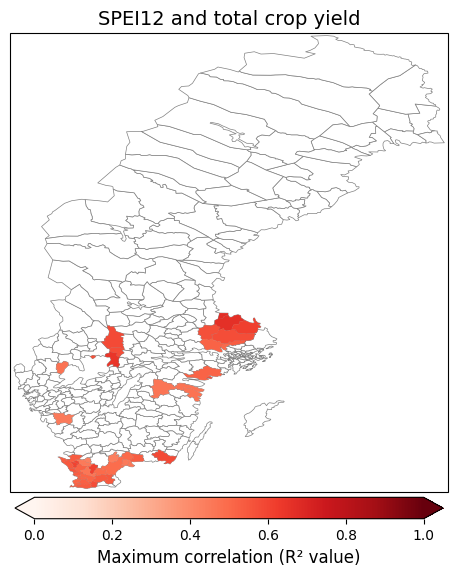

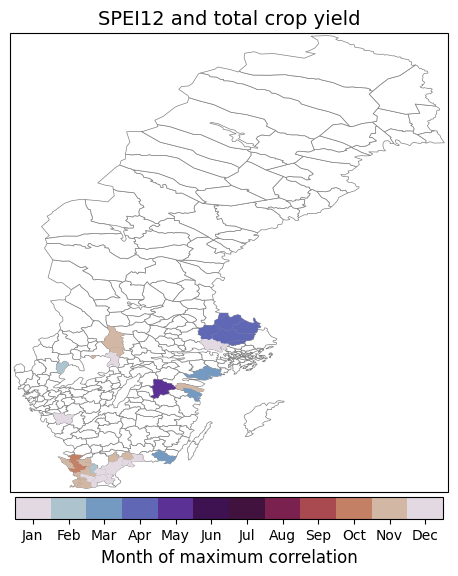

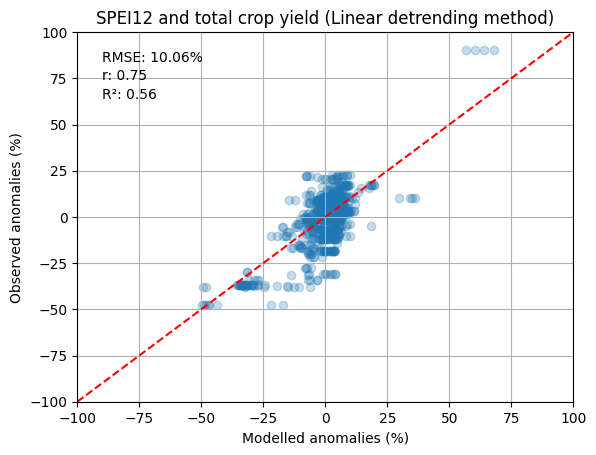

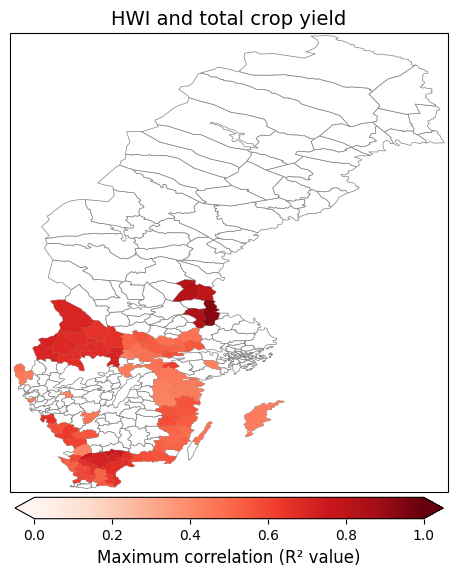

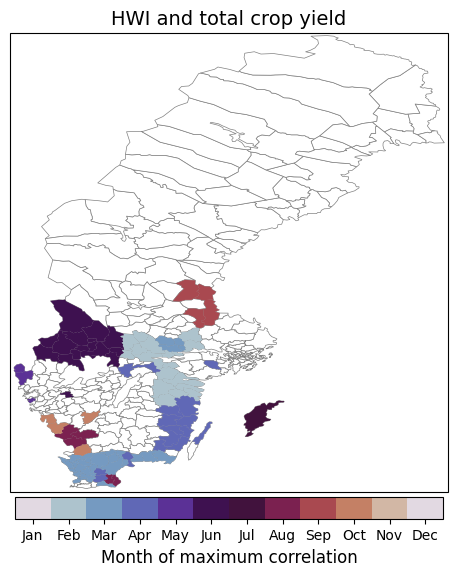

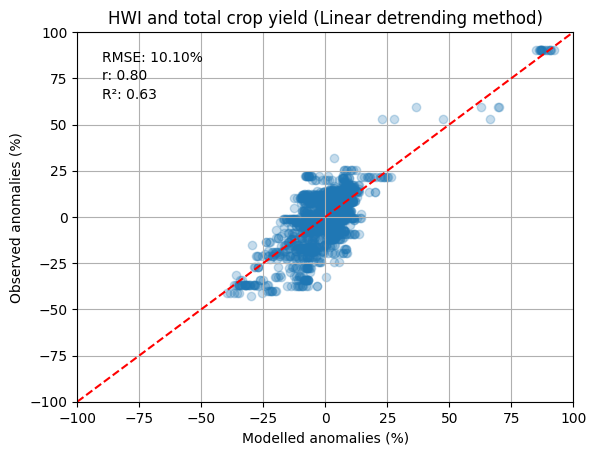

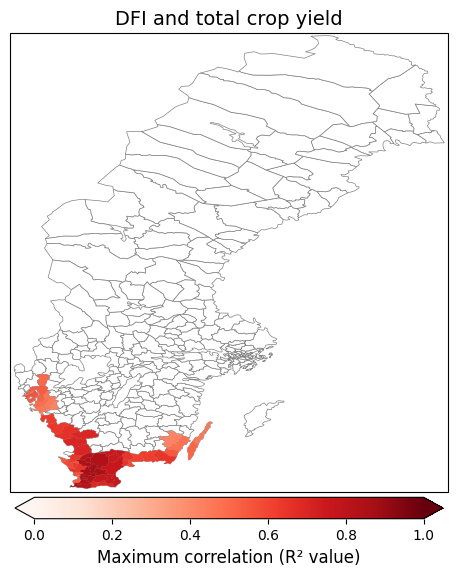

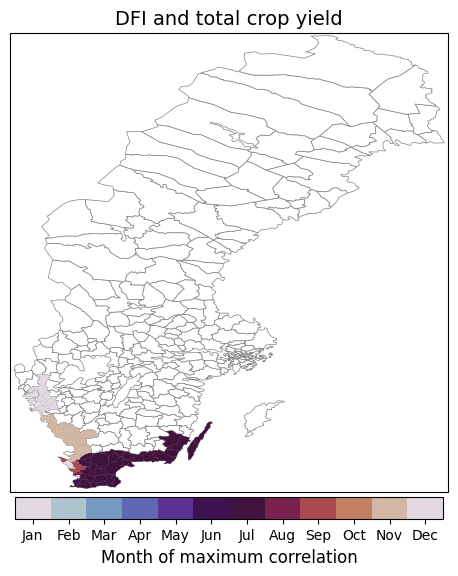

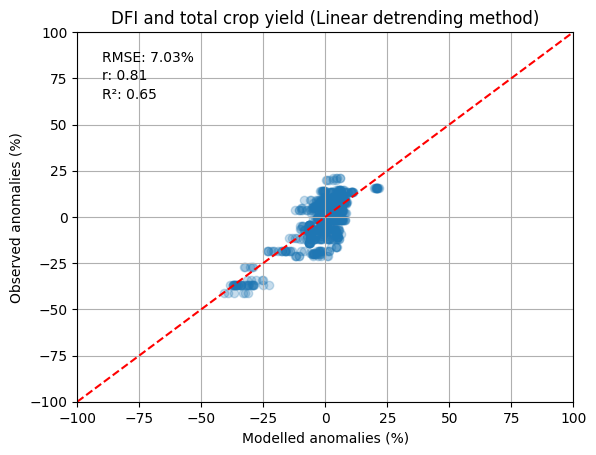

In [20]:
# Batch Runs - Food
runs_df=pd.read_excel('Variable Runs Municipality.xlsx',
                         'Food')
runs_df=runs_df.sort_values('hazard_var', ascending=False)
runs_df=runs_df[runs_df['Threshold Type']=='none']
all_corr_df=pd.DataFrame()
all_count_df=pd.DataFrame()
all_saved_data=pd.DataFrame()
trends=['Linear']
runs_df['Count']=np.nan
runs_df['Trend']=np.nan
runs_df['Median R2']=np.nan
runs_df['Aggregation']=1
runs_no_trend=runs_df.copy()
for trend in trends:
    runs_df_trend=runs_no_trend.copy()
    runs_df_trend['Trend']=trend
    runs_df = pd.concat([runs_df, runs_df_trend], ignore_index=True)
runs_df=runs_df.dropna(subset='Trend')
months=[2,3,4,5,6,7,8,9,10,11,12]
runs_no_month=runs_df.copy()
for month in months:
    runs_df_month=runs_no_month.copy()
    runs_df_month['Aggregation']=month
    runs_df = pd.concat([runs_df, runs_df_month], ignore_index=True)
for N in range(len(runs_df)):
    trend= runs_df['Trend'].iloc[N]
    var_imp= runs_df['impact_var'].iloc[N]
    var_haz= runs_df['hazard_var'].iloc[N]
    conversion= runs_df['Conversion'].iloc[N]
    threshold= runs_df['Threshold'].iloc[N]
    t_type= runs_df['Threshold Type'].iloc[N]
    #threshold=0
    agg_type= runs_df['Aggregation'].iloc[N]
    data=read_data(agg_type)
    #agg_type= 'mean'
    print('Hazard variable: '+var_haz)
    print('Impact variable: '+var_imp)
    print('Aggregation type: '+str(agg_type))
    print('Threshold type: '+str(t_type))
    print('Trend: '+str(trend))
    print('Threshold: '+str(threshold))
    corr_df, count_df, mean_r2, median_r2, count, saved_data = correlations(data, var_imp, var_haz, threshold, trend, agg_type)
    runs_df['Mean R2'].iloc[N]=mean_r2
    runs_df['Median R2'].iloc[N]=median_r2
    runs_df['Count'].iloc[N]=count # number of municipality with statistically significant results
    all_corr_df = pd.concat([all_corr_df, corr_df], ignore_index=True)
    all_saved_data = pd.concat([all_saved_data, saved_data], ignore_index=True)
    all_count_df = pd.concat([all_count_df, count_df], ignore_index=True)
runs_df.to_excel('Runs_food_municipalities_months.xlsx')
all_saved_data.to_csv('Results_food_municipalities_months.csv')
all_corr_df.to_excel('All_correlations_food_municipalities_months.xlsx')
# Plot graphs of maximum correlations
max_df=pd.DataFrame()
max_df['R2 overall']=np.nan
max_df['RMSE overall']=np.nan
r_squared_list=[]
r_list=[]
p_list=[]
rmse_list=[]
hazvar_list=[]
impvar_list=[]
trend_list=[]
for trend in all_count_df['Trend'].unique():
    for hazvar in all_count_df['Hazard variable'].unique():
        for impvar in all_count_df['Impact variable'].unique():
            hazvar_list.append(hazvar)
            impvar_list.append(impvar)
            trend_list.append(trend)
           # Select all correlations for all municipalities and months by hazard pair and trend type 
            all_corr_df_var=all_corr_df[all_corr_df['Hazard variable']==hazvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Impact variable']==impvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Trend']==trend]
            # Find maximum correlations by month 
            max_corr_agg = all_corr_df_var.groupby(['Municipality','Impact variable', 'Hazard variable', 'Trend']).agg('max').reset_index()
            max_corr_agg = max_corr_agg[max_corr_agg['Correlation']>0]
            # Drop Aggregation Column from max_corr_agg
            max_corr_agg.drop(columns=['Aggregation', 'A', 'B', 'C', 'D', 'p'], inplace=True)
            # Merge max_corr_agg with all_corr_df based on Correlation and Municipality to obtain corresponding Aggregation with maximum correlation
            max_corr_agg = pd.merge(max_corr_agg, all_corr_df, on=['Municipality', 'Impact variable', 'Hazard variable', 'Correlation', 'Trend'], how='left')
            corr_gdf = pd.merge(kommun_shapefile, max_corr_agg, left_on='KnNamn', right_on='Municipality')
            # Next, retrieve yearly impacts based on month with highest correlation 
            max_data= pd.merge(max_corr_agg, all_saved_data, on=['Municipality', 'Impact variable', 'Hazard variable', 'Aggregation', 'Trend'], how='left')
            impvar_name=impact_info[impact_info['var']==impvar]['Variable Name'].values[0]
            hazvar_name=hazard_info[hazard_info['var']==hazvar]['Variable Name'].values[0]
            title= hazvar_name +' and ' + impvar_name.lower()
            plot_map(corr_gdf, 'Correlation', title, 'Maximum correlation (R² value)',
                     lower_bound=0, upper_bound=1, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_corrs')
            plot_map_months(corr_gdf, 'Aggregation', title, 'Month of maximum correlation',
                     lower_bound=1, upper_bound=13, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_months')

            # Sample data
            predicted_anomalies = max_data['Predicted anomalies']
            observed_anomalies = max_data['Observed anomalies']
            
            # Step 1: Filter out anomalies that are too large or too low
            predicted_anomalies = np.where((predicted_anomalies > 100) | (predicted_anomalies < -100), np.nan, predicted_anomalies)
            observed_anomalies = np.where((observed_anomalies > 100) | (observed_anomalies < -100), np.nan, observed_anomalies)

            # Step 2: Create a mask for indices where both arrays are non-NaN
            valid_mask = ~np.isnan(predicted_anomalies) & ~np.isnan(observed_anomalies)

            # Step 3: Filter both arrays using the mask
            predicted_anomalies = predicted_anomalies[valid_mask]
            observed_anomalies = observed_anomalies[valid_mask]

            # Calculate mean root square error and R-squared
            r_squared = r2_score(observed_anomalies, predicted_anomalies)
            r_squared_list.append(r_squared)
            r, p_value = pearsonr(observed_anomalies, predicted_anomalies)
            r_list.append(r)
            p_list.append(p_value)
            #print("R-squared:", r_squared)
            mse = mean_squared_error(observed_anomalies, predicted_anomalies)
            rmse = np.sqrt(mse)
            rmse_list.append(rmse)
            # Define limits
            limit = (-100, 100)

            # Plot scatter with transparency
            plt.scatter(predicted_anomalies, observed_anomalies, alpha=0.25)
            plt.xlim(limit)
            plt.ylim(limit)
            plt.xlabel('Modelled anomalies (%)')
            plt.ylabel('Observed anomalies (%)')
            plt.title(title+' ('+trend+' detrending method)')
            # Plot diagonal line
            plt.plot(limit, limit, color='red', linestyle='--')

            # Add text boxes for mean root square error and R-squared
            plt.text(0.05, 0.95, f'RMSE: {rmse:.2f}%', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.90, f'r: {r:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.85, f'R²: {r_squared:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.grid(True)
            plt.show()

# Save results
max_df['Impact variable']=impvar_list
max_df['Hazard variable']=hazvar_list
max_df['Trend']=trend_list
max_df['R2 overall']=r_squared_list
max_df['R overall']=r_list
max_df['RMSE overall']=rmse_list
max_df['p overall']=p_list
max_df.to_excel('Correlations_food_municipalities_months.xlsx')

Hazard variable: SPEI12
Impact variable: discharge
Aggregation type: 1
Threshold type: none
Trend: Linear
Threshold: nan
discharge
SPEI12


  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.033
Breusch-Pagan p-value for Alingsås: 0.511
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.821
Breusch-Pagan p-value for Borås: 0.168
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.878
Breusch-Pagan p-value for Dals-Ed: 0.305
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.817
Breusch-Pagan p-value for Falköping: 0.129
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.261
Breusch-Pagan p-value for Alingsås: 0.505
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.928
Breusch-Pagan p-value for Borås: 0.044
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Dals-Ed: 1.923
Breusch-Pagan p-value for Dals-Ed: 0.087
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.917
Breusch-Pagan p-value for Falköping: 0.136
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorrelat

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.263
Breusch-Pagan p-value for Alingsås: 0.413
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.085
Breusch-Pagan p-value for Borås: 0.282
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.908
Breusch-Pagan p-value for Dals-Ed: 0.349
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.986
Breusch-Pagan p-value for Falköping: 0.348
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.112
Breusch-Pagan p-value for Alingsås: 0.710
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.802
Breusch-Pagan p-value for Borås: 0.288
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.068
Breusch-Pagan p-value for Dals-Ed: 0.818
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.828
Breusch-Pagan p-value for Falköping: 0.218
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.739
Breusch-Pagan p-value for Alingsås: 0.206
[Alingsås] The model is statistically significant (good).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.438
Breusch-Pagan p-value for Borås: 0.320
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant autocorrelation (bad).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.885
Breusch-Pagan p-value for Dals-Ed: 0.166
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.399
Breusch-Pagan p-value for Falköping: 0.504
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals HAVE significant autocorrelation (b

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.475
Breusch-Pagan p-value for Alingsås: 0.509
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.117
Breusch-Pagan p-value for Borås: 0.266
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.106
Breusch-Pagan p-value for Dals-Ed: 0.656
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.937
Breusch-Pagan p-value for Falköping: 0.419
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.220
Breusch-Pagan p-value for Alingsås: 0.679
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.971
Breusch-Pagan p-value for Borås: 0.500
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.168
Breusch-Pagan p-value for Dals-Ed: 0.940
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.844
Breusch-Pagan p-value for Falköping: 0.297
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.076
Breusch-Pagan p-value for Alingsås: 0.635
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.625
Breusch-Pagan p-value for Borås: 0.515
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.886
Breusch-Pagan p-value for Dals-Ed: 0.314
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.252
Breusch-Pagan p-value for Falköping: 0.461
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals HAVE significant autocorrelatio

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.168
Breusch-Pagan p-value for Alingsås: 0.262
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.954
Breusch-Pagan p-value for Borås: 0.372
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.071
Breusch-Pagan p-value for Dals-Ed: 0.664
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.685
Breusch-Pagan p-value for Falköping: 0.105
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.154
Breusch-Pagan p-value for Alingsås: 0.795
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.785
Breusch-Pagan p-value for Borås: 0.380
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.091
Breusch-Pagan p-value for Dals-Ed: 0.786
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.815
Breusch-Pagan p-value for Falköping: 0.268
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.815
Breusch-Pagan p-value for Alingsås: 0.607
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.828
Breusch-Pagan p-value for Borås: 0.186
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.076
Breusch-Pagan p-value for Dals-Ed: 0.248
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.820
Breusch-Pagan p-value for Falköping: 0.495
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.078
Breusch-Pagan p-value for Alingsås: 0.077
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.859
Breusch-Pagan p-value for Borås: 0.818
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.323
Breusch-Pagan p-value for Dals-Ed: 0.108
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.885
Breusch-Pagan p-value for Falköping: 0.414
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.836
Breusch-Pagan p-value for Alingsås: 0.420
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.873
Breusch-Pagan p-value for Borås: 0.416
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.917
Breusch-Pagan p-value for Dals-Ed: 0.838
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.788
Breusch-Pagan p-value for Falköping: 0.570
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.105
Breusch-Pagan p-value for Alingsås: 0.557
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.042
Breusch-Pagan p-value for Borås: 0.380
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.162
Breusch-Pagan p-value for Dals-Ed: 0.370
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.960
Breusch-Pagan p-value for Falköping: 0.920
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.426
Breusch-Pagan p-value for Alingsås: 0.964
[Alingsås] The model is statistically significant (good).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.848
Breusch-Pagan p-value for Borås: 0.545
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.531
Breusch-Pagan p-value for Dals-Ed: 0.097
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals HAVE significant autocorrelation (bad).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.618
Breusch-Pagan p-value for Falköping: 0.206
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorrelation

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.185
Breusch-Pagan p-value for Alingsås: 0.225
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.883
Breusch-Pagan p-value for Borås: 0.304
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.973
Breusch-Pagan p-value for Dals-Ed: 0.834
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.911
Breusch-Pagan p-value for Falköping: 0.267
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.055
Breusch-Pagan p-value for Alingsås: 0.216
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.269
Breusch-Pagan p-value for Borås: 0.099
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.822
Breusch-Pagan p-value for Dals-Ed: 0.582
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.912
Breusch-Pagan p-value for Falköping: 0.675
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.011
Breusch-Pagan p-value for Alingsås: 0.256
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.806
Breusch-Pagan p-value for Borås: 0.331
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.317
Breusch-Pagan p-value for Dals-Ed: 0.232
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.759
Breusch-Pagan p-value for Falköping: 0.658
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.504
Breusch-Pagan p-value for Alingsås: 0.385
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.242
Breusch-Pagan p-value for Borås: 0.265
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.149
Breusch-Pagan p-value for Dals-Ed: 0.429
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.960
Breusch-Pagan p-value for Falköping: 0.198
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorrelat

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.950
Breusch-Pagan p-value for Alingsås: 0.782
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.792
Breusch-Pagan p-value for Borås: 0.206
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.873
Breusch-Pagan p-value for Dals-Ed: 0.038
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Falköping: 1.671
Breusch-Pagan p-value for Falköping: 0.316
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorrelat

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.327
Breusch-Pagan p-value for Alingsås: 0.357
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.054
Breusch-Pagan p-value for Borås: 0.279
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.099
Breusch-Pagan p-value for Dals-Ed: 0.093
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 2.153
Breusch-Pagan p-value for Falköping: 0.393
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.575
Breusch-Pagan p-value for Alingsås: 0.261
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.269
Breusch-Pagan p-value for Borås: 0.096
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.228
Breusch-Pagan p-value for Dals-Ed: 0.059
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 2.155
Breusch-Pagan p-value for Falköping: 0.192
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorrelat

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.198
Breusch-Pagan p-value for Alingsås: 0.849
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.852
Breusch-Pagan p-value for Borås: 0.220
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.969
Breusch-Pagan p-value for Dals-Ed: 0.291
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.916
Breusch-Pagan p-value for Falköping: 0.449
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.793
Breusch-Pagan p-value for Alingsås: 0.190
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.540
Breusch-Pagan p-value for Borås: 0.154
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.916
Breusch-Pagan p-value for Dals-Ed: 0.537
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.294
Breusch-Pagan p-value for Falköping: 0.054
[Falköping] The model is statistically significant (good).
[Falköping] Residuals HAVE significant autocorrelation (

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.518
Breusch-Pagan p-value for Alingsås: 0.677
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.298
Breusch-Pagan p-value for Borås: 0.517
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.462
Breusch-Pagan p-value for Dals-Ed: 0.141
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.817
Breusch-Pagan p-value for Falköping: 0.357
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorrelat

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.995
Breusch-Pagan p-value for Alingsås: 0.629
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.855
Breusch-Pagan p-value for Borås: 0.517
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.034
Breusch-Pagan p-value for Dals-Ed: 0.472
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.789
Breusch-Pagan p-value for Falköping: 0.489
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.660
Breusch-Pagan p-value for Alingsås: 0.506
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.574
Breusch-Pagan p-value for Borås: 0.534
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.847
Breusch-Pagan p-value for Dals-Ed: 0.489
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.590
Breusch-Pagan p-value for Falköping: 0.238
[Falköping] The model is statistically significant (good).
[Falköping] Residuals have NO significant autocorrelatio

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.270
Breusch-Pagan p-value for Alingsås: 0.786
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.340
Breusch-Pagan p-value for Borås: 0.802
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.278
Breusch-Pagan p-value for Dals-Ed: 0.286
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.970
Breusch-Pagan p-value for Falköping: 0.820
[Falköping] The model is statistically significant (good).
[Falköping] Residuals have NO significant autocorrelatio

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.102
Breusch-Pagan p-value for Alingsås: 0.825
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.936
Breusch-Pagan p-value for Borås: 0.681
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.742
Breusch-Pagan p-value for Dals-Ed: 0.405
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.818
Breusch-Pagan p-value for Falköping: 0.279
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.931
Breusch-Pagan p-value for Alingsås: 0.156
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.998
Breusch-Pagan p-value for Borås: 0.960
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.993
Breusch-Pagan p-value for Dals-Ed: 0.325
[Dals-Ed] The model is statistically significant (good).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.933
Breusch-Pagan p-value for Falköping: 0.782
[Falköping] The model is statistically significant (good).
[Falköping] Residuals have NO significant autocorrelation (

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.623
Breusch-Pagan p-value for Alingsås: 0.462
[Alingsås] The model is statistically significant (good).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.946
Breusch-Pagan p-value for Borås: 0.731
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.514
Breusch-Pagan p-value for Dals-Ed: 0.057
[Dals-Ed] The model is statistically significant (good).
[Dals-Ed] Residuals HAVE significant autocorrelation (bad).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.522
Breusch-Pagan p-value for Falköping: 0.757
[Falköping] The model is statistically significant (good).
[Falköping] Residuals have NO significant autocorrelation (good).


  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.112
Breusch-Pagan p-value for Alingsås: 0.675
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.905
Breusch-Pagan p-value for Borås: 0.671
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.829
Breusch-Pagan p-value for Dals-Ed: 0.543
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.789
Breusch-Pagan p-value for Falköping: 0.589
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.742
Breusch-Pagan p-value for Alingsås: 0.414
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.994
Breusch-Pagan p-value for Borås: 0.543
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.770
Breusch-Pagan p-value for Dals-Ed: 0.071
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.907
Breusch-Pagan p-value for Falköping: 0.406
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.724
Breusch-Pagan p-value for Alingsås: 0.783
[Alingsås] The model is statistically significant (good).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.997
Breusch-Pagan p-value for Borås: 0.744
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 2.386
Breusch-Pagan p-value for Dals-Ed: 0.044
[Dals-Ed] The model is statistically significant (good).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Falköping: 1.471
Breusch-Pagan p-value for Falköping: 0.711
[Falköping] The model is statistically significant (good).
[Falköping] Residuals HAVE significant autocorrelation (bad).
[Fal

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.130
Breusch-Pagan p-value for Alingsås: 0.231
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.871
Breusch-Pagan p-value for Borås: 0.600
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.765
Breusch-Pagan p-value for Dals-Ed: 0.679
[Dals-Ed] The model is NOT statistically significant (bad).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.744
Breusch-Pagan p-value for Falköping: 0.668
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorr

  0%|          | 0/124 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.983
Breusch-Pagan p-value for Alingsås: 0.069
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 2.113
Breusch-Pagan p-value for Borås: 0.512
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant autocorrelation (good).
[Borås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Dals-Ed: 1.817
Breusch-Pagan p-value for Dals-Ed: 0.257
[Dals-Ed] The model is statistically significant (good).
[Dals-Ed] Residuals have NO significant autocorrelation (good).
[Dals-Ed] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Falköping: 1.812
Breusch-Pagan p-value for Falköping: 0.419
[Falköping] The model is NOT statistically significant (bad).
[Falköping] Residuals have NO significant autocorrela

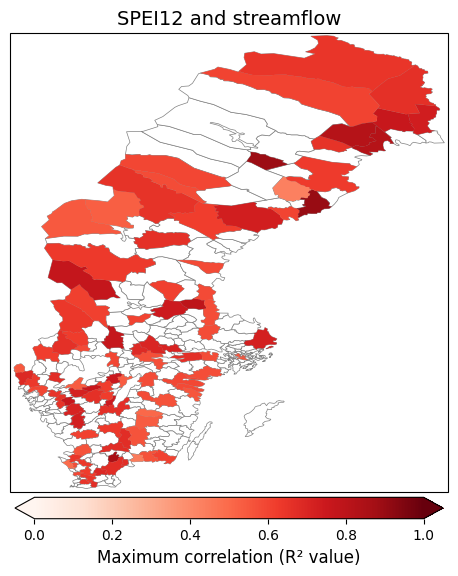

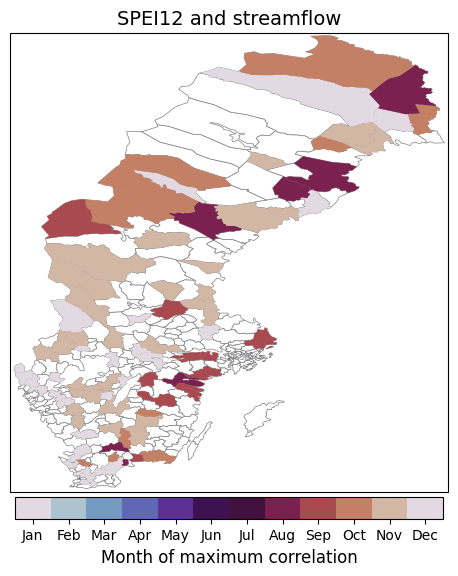

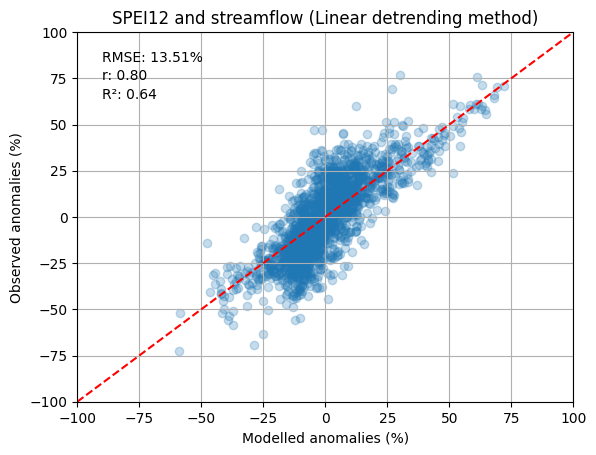

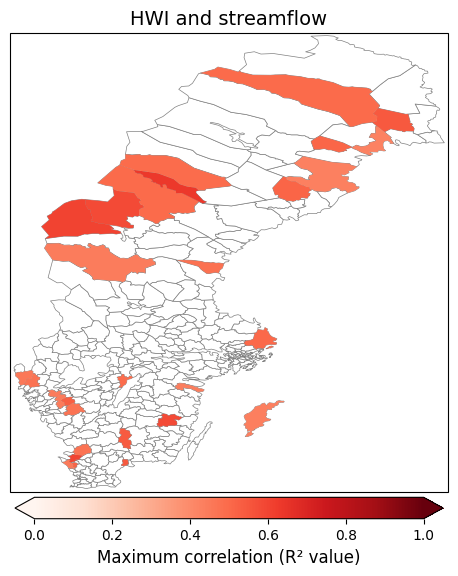

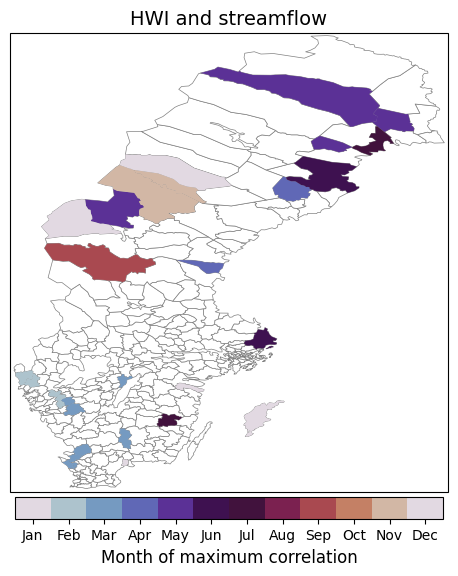

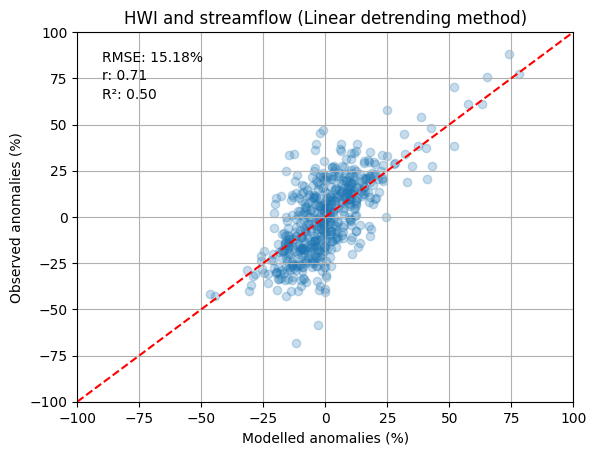

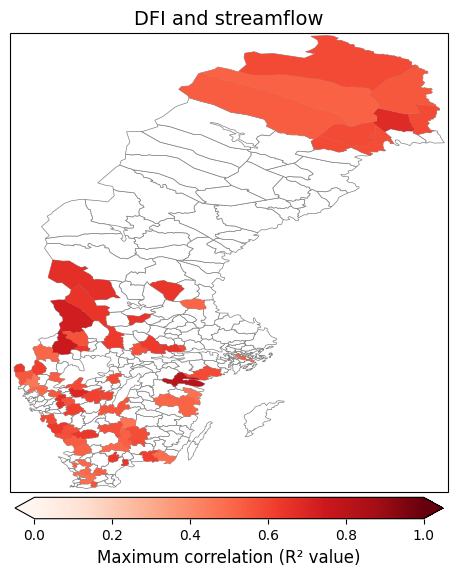

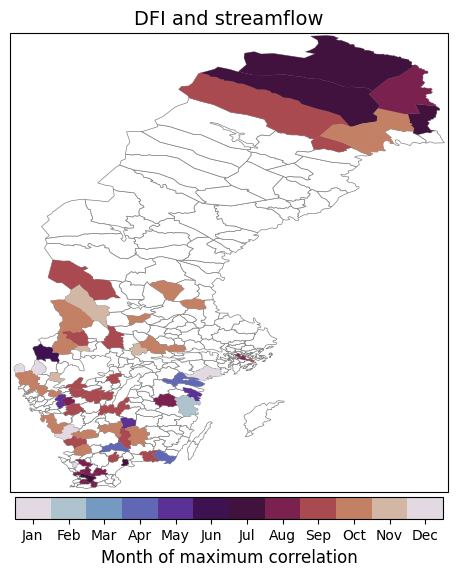

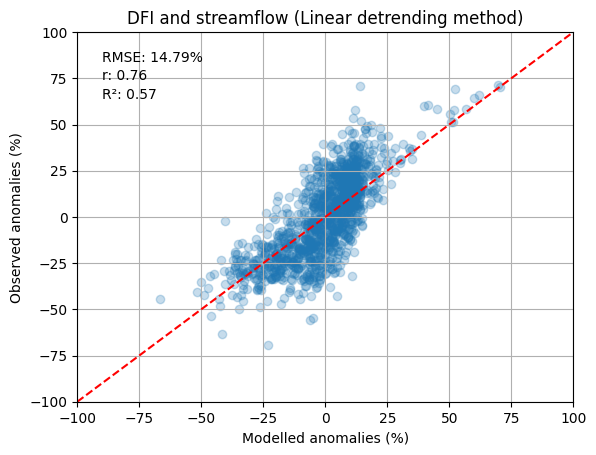

In [21]:
# Batch Runs - Water
runs_df=pd.read_excel('Variable Runs Municipality.xlsx','Water')
runs_df=runs_df.sort_values('hazard_var', ascending=False)
runs_df=runs_df[runs_df['Threshold Type']=='none']
all_corr_df=pd.DataFrame()
all_count_df=pd.DataFrame()
all_saved_data=pd.DataFrame()
trends=['Linear']
runs_df['Count']=np.nan
runs_df['Trend']=np.nan
runs_df['Median R2']=np.nan
runs_df['Aggregation']=1
runs_no_trend=runs_df.copy()
for trend in trends:
    runs_df_trend=runs_no_trend.copy()
    runs_df_trend['Trend']=trend
    runs_df = pd.concat([runs_df, runs_df_trend], ignore_index=True)
runs_df=runs_df.dropna(subset='Trend')
months=[2,3,4,5,6,7,8,9,10,11,12]
runs_no_month=runs_df.copy()
for month in months:
    runs_df_month=runs_no_month.copy()
    runs_df_month['Aggregation']=month
    runs_df = pd.concat([runs_df, runs_df_month], ignore_index=True)
for N in range(len(runs_df)):
    trend= runs_df['Trend'].iloc[N]
    var_imp= runs_df['impact_var'].iloc[N]
    var_haz= runs_df['hazard_var'].iloc[N]
    conversion= runs_df['Conversion'].iloc[N]
    threshold= runs_df['Threshold'].iloc[N]
    t_type= runs_df['Threshold Type'].iloc[N]
    #threshold=0
    agg_type= runs_df['Aggregation'].iloc[N]
    data=read_data(agg_type)
    #agg_type= 'mean'
    print('Hazard variable: '+var_haz)
    print('Impact variable: '+var_imp)
    print('Aggregation type: '+str(agg_type))
    print('Threshold type: '+str(t_type))
    print('Trend: '+str(trend))
    print('Threshold: '+str(threshold))
    corr_df, count_df, mean_r2, median_r2, count, saved_data = correlations(data, var_imp, var_haz, threshold, trend, agg_type)
    runs_df['Mean R2'].iloc[N]=mean_r2
    runs_df['Median R2'].iloc[N]=median_r2
    runs_df['Count'].iloc[N]=count # number of municipality with statistically significant results
    all_corr_df = pd.concat([all_corr_df, corr_df], ignore_index=True)
    all_saved_data = pd.concat([all_saved_data, saved_data], ignore_index=True)
    all_count_df = pd.concat([all_count_df, count_df], ignore_index=True)
runs_df.to_excel('Runs_water_municipalities_months.xlsx')
all_saved_data.to_csv('Results_water_municipalities_months.csv')
all_corr_df.to_excel('All_correlations_water_municipalities_months.xlsx')
# Plot graphs of maximum correlations
max_df=pd.DataFrame()
max_df['R2 overall']=np.nan
max_df['RMSE overall']=np.nan
r_squared_list=[]
r_list=[]
p_list=[]
rmse_list=[]
hazvar_list=[]
impvar_list=[]
trend_list=[]
for trend in all_count_df['Trend'].unique():
    for hazvar in all_count_df['Hazard variable'].unique():
        for impvar in all_count_df['Impact variable'].unique():
            hazvar_list.append(hazvar)
            impvar_list.append(impvar)
            trend_list.append(trend)
           # Select all correlations for all municipalities and months by hazard pair and trend type 
            all_corr_df_var=all_corr_df[all_corr_df['Hazard variable']==hazvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Impact variable']==impvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Trend']==trend]
            # Find maximum correlations by month 
            max_corr_agg = all_corr_df_var.groupby(['Municipality','Impact variable', 'Hazard variable', 'Trend']).agg('max').reset_index()
            max_corr_agg = max_corr_agg[max_corr_agg['Correlation']>0]
            # Drop Aggregation Column from max_corr_agg
            max_corr_agg.drop(columns=['Aggregation', 'A', 'B', 'C', 'D', 'p'], inplace=True)
            # Merge max_corr_agg with all_corr_df based on Correlation and Municipality to obtain corresponding Aggregation with maximum correlation
            max_corr_agg = pd.merge(max_corr_agg, all_corr_df, on=['Municipality', 'Impact variable', 'Hazard variable', 'Correlation', 'Trend'], how='left')
            corr_gdf = pd.merge(kommun_shapefile, max_corr_agg, left_on='KnNamn', right_on='Municipality')
            # Next, retrieve yearly impacts based on month with highest correlation 
            max_data= pd.merge(max_corr_agg, all_saved_data, on=['Municipality', 'Impact variable', 'Hazard variable', 'Aggregation', 'Trend'], how='left')
            impvar_name=impact_info[impact_info['var']==impvar]['Variable Name'].values[0]
            hazvar_name=hazard_info[hazard_info['var']==hazvar]['Variable Name'].values[0]
            title= hazvar_name +' and ' + impvar_name.lower()
            plot_map(corr_gdf, 'Correlation', title, 'Maximum correlation (R² value)',
                     lower_bound=0, upper_bound=1, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_corrs')
            plot_map_months(corr_gdf, 'Aggregation', title, 'Month of maximum correlation',
                     lower_bound=1, upper_bound=13, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_months')

            # Sample data
            predicted_anomalies = max_data['Predicted anomalies']
            observed_anomalies = max_data['Observed anomalies']
            
            # Step 1: Filter out anomalies that are too large or too low
            predicted_anomalies = np.where((predicted_anomalies > 100) | (predicted_anomalies < -100), np.nan, predicted_anomalies)
            observed_anomalies = np.where((observed_anomalies > 100) | (observed_anomalies < -100), np.nan, observed_anomalies)

            # Step 2: Create a mask for indices where both arrays are non-NaN
            valid_mask = ~np.isnan(predicted_anomalies) & ~np.isnan(observed_anomalies)

            # Step 3: Filter both arrays using the mask
            predicted_anomalies = predicted_anomalies[valid_mask]
            observed_anomalies = observed_anomalies[valid_mask]

            # Calculate mean root square error and R-squared
            r_squared = r2_score(observed_anomalies, predicted_anomalies)
            r_squared_list.append(r_squared)
            r, p_value = pearsonr(observed_anomalies, predicted_anomalies)
            r_list.append(r)
            p_list.append(p_value)
            #print("R-squared:", r_squared)
            mse = mean_squared_error(observed_anomalies, predicted_anomalies)
            rmse = np.sqrt(mse)
            rmse_list.append(rmse)
            # Define limits
            limit = (-100, 100)

            # Plot scatter with transparency
            plt.scatter(predicted_anomalies, observed_anomalies, alpha=0.25)
            plt.xlim(limit)
            plt.ylim(limit)
            plt.xlabel('Modelled anomalies (%)')
            plt.ylabel('Observed anomalies (%)')
            plt.title(title+' ('+trend+' detrending method)')
            # Plot diagonal line
            plt.plot(limit, limit, color='red', linestyle='--')

            # Add text boxes for mean root square error and R-squared
            plt.text(0.05, 0.95, f'RMSE: {rmse:.2f}%', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.90, f'r: {r:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.85, f'R²: {r_squared:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.grid(True)
            plt.show()

# Save results
max_df['Impact variable']=impvar_list
max_df['Hazard variable']=hazvar_list
max_df['Trend']=trend_list
max_df['R2 overall']=r_squared_list
max_df['R overall']=r_list
max_df['RMSE overall']=rmse_list
max_df['p overall']=p_list
max_df.to_excel('Correlations_water_municipalities_months.xlsx')

Hazard variable: SPEI12
Impact variable: hydro_prod
Aggregation type: 1
Threshold type: none
Trend: Linear
Threshold: nan
hydro_prod
SPEI12


  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.317
Breusch-Pagan p-value for Alingsås: 0.538
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.273
Breusch-Pagan p-value for Bengtsfors: 0.577
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.064
Breusch-Pagan p-value for Bollebygd: 0.176
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.641
Breusch-Pagan p-value for Borås: 0.131
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.342
Breusch-Pagan p-value for Alingsås: 0.925
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.834
Breusch-Pagan p-value for Bengtsfors: 0.305
[Bengtsfors] The model is statistically significant (good).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.280
Breusch-Pagan p-value for Bollebygd: 0.760
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.783
Breusch-Pagan p-value for Borås: 0.540
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO signific

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.967
Breusch-Pagan p-value for Alingsås: 0.613
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.339
Breusch-Pagan p-value for Bengtsfors: 0.815
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.116
Breusch-Pagan p-value for Bollebygd: 0.361
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.850
Breusch-Pagan p-value for Borås: 0.232
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.435
Breusch-Pagan p-value for Alingsås: 0.551
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.467
Breusch-Pagan p-value for Bengtsfors: 0.840
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.834
Breusch-Pagan p-value for Bollebygd: 0.734
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.494
Breusch-Pagan p-value for Borås: 0.158
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant 

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.995
Breusch-Pagan p-value for Alingsås: 0.434
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.723
Breusch-Pagan p-value for Bengtsfors: 0.560
[Bengtsfors] The model is statistically significant (good).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.598
Breusch-Pagan p-value for Bollebygd: 0.602
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.388
Breusch-Pagan p-value for Borås: 0.508
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.017
Breusch-Pagan p-value for Alingsås: 0.679
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.359
Breusch-Pagan p-value for Bengtsfors: 0.627
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.337
Breusch-Pagan p-value for Bollebygd: 0.452
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.898
Breusch-Pagan p-value for Borås: 0.354
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.306
Breusch-Pagan p-value for Alingsås: 0.420
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.499
Breusch-Pagan p-value for Bengtsfors: 0.742
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.119
Breusch-Pagan p-value for Bollebygd: 0.815
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.828
Breusch-Pagan p-value for Borås: 0.288
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.404
Breusch-Pagan p-value for Alingsås: 0.553
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.262
Breusch-Pagan p-value for Bengtsfors: 0.417
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.813
Breusch-Pagan p-value for Bollebygd: 0.323
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.021
Breusch-Pagan p-value for Borås: 0.497
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant 

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.142
Breusch-Pagan p-value for Alingsås: 0.716
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.336
Breusch-Pagan p-value for Bengtsfors: 0.682
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.138
Breusch-Pagan p-value for Bollebygd: 0.962
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.782
Breusch-Pagan p-value for Borås: 0.789
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.956
Breusch-Pagan p-value for Alingsås: 0.385
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.388
Breusch-Pagan p-value for Bengtsfors: 0.559
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.952
Breusch-Pagan p-value for Bollebygd: 0.966
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.605
Breusch-Pagan p-value for Borås: 0.422
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.238
Breusch-Pagan p-value for Alingsås: 0.516
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.096
Breusch-Pagan p-value for Bengtsfors: 0.457
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.135
Breusch-Pagan p-value for Bollebygd: 0.763
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.743
Breusch-Pagan p-value for Borås: 0.381
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.134
Breusch-Pagan p-value for Alingsås: 0.513
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.270
Breusch-Pagan p-value for Bengtsfors: 0.599
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.122
Breusch-Pagan p-value for Bollebygd: 0.275
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.756
Breusch-Pagan p-value for Borås: 0.372
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.975
Breusch-Pagan p-value for Alingsås: 0.458
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.283
Breusch-Pagan p-value for Bengtsfors: 0.614
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.935
Breusch-Pagan p-value for Bollebygd: 0.845
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.693
Breusch-Pagan p-value for Borås: 0.260
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.025
Breusch-Pagan p-value for Alingsås: 0.390
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.350
Breusch-Pagan p-value for Bengtsfors: 0.557
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.096
Breusch-Pagan p-value for Bollebygd: 0.682
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.988
Breusch-Pagan p-value for Borås: 0.795
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.126
Breusch-Pagan p-value for Alingsås: 0.012
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Bengtsfors: 1.416
Breusch-Pagan p-value for Bengtsfors: 0.525
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.918
Breusch-Pagan p-value for Bollebygd: 0.111
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.656
Breusch-Pagan p-value for Borås: 0.998
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant a

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.487
Breusch-Pagan p-value for Alingsås: 0.630
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.273
Breusch-Pagan p-value for Bengtsfors: 0.329
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.675
Breusch-Pagan p-value for Bollebygd: 0.398
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.425
Breusch-Pagan p-value for Borås: 0.241
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant 

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.237
Breusch-Pagan p-value for Alingsås: 0.222
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.151
Breusch-Pagan p-value for Bengtsfors: 0.440
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.537
Breusch-Pagan p-value for Bollebygd: 0.466
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocorrelation (good).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.987
Breusch-Pagan p-value for Borås: 0.783
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO signi

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.940
Breusch-Pagan p-value for Alingsås: 0.775
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.315
Breusch-Pagan p-value for Bengtsfors: 0.648
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.035
Breusch-Pagan p-value for Bollebygd: 0.064
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.559
Breusch-Pagan p-value for Borås: 0.263
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.308
Breusch-Pagan p-value for Alingsås: 0.399
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.273
Breusch-Pagan p-value for Bengtsfors: 0.229
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.845
Breusch-Pagan p-value for Bollebygd: 0.531
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.722
Breusch-Pagan p-value for Borås: 0.140
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.356
Breusch-Pagan p-value for Alingsås: 0.493
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.562
Breusch-Pagan p-value for Bengtsfors: 0.700
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.913
Breusch-Pagan p-value for Bollebygd: 0.741
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.449
Breusch-Pagan p-value for Borås: 0.241
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE signific

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.115
Breusch-Pagan p-value for Alingsås: 0.380
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.270
Breusch-Pagan p-value for Bengtsfors: 0.403
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.201
Breusch-Pagan p-value for Bollebygd: 0.702
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.759
Breusch-Pagan p-value for Borås: 0.566
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.112
Breusch-Pagan p-value for Alingsås: 0.046
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Bengtsfors: 1.310
Breusch-Pagan p-value for Bengtsfors: 0.546
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.082
Breusch-Pagan p-value for Bollebygd: 0.777
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.764
Breusch-Pagan p-value for Borås: 0.234
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant a

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.135
Breusch-Pagan p-value for Alingsås: 0.509
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.256
Breusch-Pagan p-value for Bengtsfors: 0.636
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.886
Breusch-Pagan p-value for Bollebygd: 0.436
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.416
Breusch-Pagan p-value for Borås: 0.255
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant 

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.354
Breusch-Pagan p-value for Alingsås: 0.698
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.337
Breusch-Pagan p-value for Bengtsfors: 0.377
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.864
Breusch-Pagan p-value for Bollebygd: 0.013
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Borås: 1.366
Breusch-Pagan p-value for Borås: 0.682
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant auto

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.120
Breusch-Pagan p-value for Alingsås: 0.404
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.226
Breusch-Pagan p-value for Bengtsfors: 0.338
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.560
Breusch-Pagan p-value for Bollebygd: 0.725
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals have NO significant autocorrelation (good).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.925
Breusch-Pagan p-value for Borås: 0.329
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO signi

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.293
Breusch-Pagan p-value for Alingsås: 0.703
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.368
Breusch-Pagan p-value for Bengtsfors: 0.551
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.118
Breusch-Pagan p-value for Bollebygd: 0.630
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.675
Breusch-Pagan p-value for Borås: 0.645
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.600
Breusch-Pagan p-value for Alingsås: 0.402
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.424
Breusch-Pagan p-value for Bengtsfors: 0.282
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.921
Breusch-Pagan p-value for Bollebygd: 0.050
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Borås: 1.163
Breusch-Pagan p-value for Borås: 0.487
[Borås] The model is statistically significant (good).
[Borås] Residuals HAVE significant autocorrela

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.196
Breusch-Pagan p-value for Alingsås: 0.888
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.212
Breusch-Pagan p-value for Bengtsfors: 0.435
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.134
Breusch-Pagan p-value for Bollebygd: 0.113
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.780
Breusch-Pagan p-value for Borås: 0.339
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significa

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 1.846
Breusch-Pagan p-value for Alingsås: 0.720
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.526
Breusch-Pagan p-value for Bengtsfors: 0.335
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.045
Breusch-Pagan p-value for Bollebygd: 0.243
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.534
Breusch-Pagan p-value for Borås: 0.971
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO signi

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.178
Breusch-Pagan p-value for Alingsås: 0.944
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.191
Breusch-Pagan p-value for Bengtsfors: 0.618
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.811
Breusch-Pagan p-value for Bollebygd: 0.356
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.571
Breusch-Pagan p-value for Borås: 0.264
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant 

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.564
Breusch-Pagan p-value for Alingsås: 0.013
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Bengtsfors: 1.271
Breusch-Pagan p-value for Bengtsfors: 0.505
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.883
Breusch-Pagan p-value for Bollebygd: 0.080
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.725
Breusch-Pagan p-value for Borås: 0.276
[Borås] The model is statistically significant (good).
[Borås] Residuals have NO significant autocorr

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.177
Breusch-Pagan p-value for Alingsås: 0.658
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.287
Breusch-Pagan p-value for Bengtsfors: 0.028
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Bollebygd: 0.941
Breusch-Pagan p-value for Bollebygd: 0.768
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.810
Breusch-Pagan p-value for Borås: 0.331
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO significant a

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.318
Breusch-Pagan p-value for Alingsås: 0.998
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.210
Breusch-Pagan p-value for Bengtsfors: 0.556
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 0.874
Breusch-Pagan p-value for Bollebygd: 0.416
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.456
Breusch-Pagan p-value for Borås: 0.872
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant 

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.612
Breusch-Pagan p-value for Alingsås: 0.038
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals HAVE significant heteroskedasticity (bad).
Durbin-Watson stat for Bengtsfors: 1.220
Breusch-Pagan p-value for Bengtsfors: 0.693
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.194
Breusch-Pagan p-value for Bollebygd: 0.054
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.495
Breusch-Pagan p-value for Borås: 0.387
[Borås] The model is statistically significant (good).
[Borås] Residuals HAVE significant autocorrela

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.263
Breusch-Pagan p-value for Alingsås: 0.415
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals have NO significant autocorrelation (good).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 2.047
Breusch-Pagan p-value for Bengtsfors: 0.268
[Bengtsfors] The model is statistically significant (good).
[Bengtsfors] Residuals have NO significant autocorrelation (good).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.401
Breusch-Pagan p-value for Bollebygd: 0.694
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.771
Breusch-Pagan p-value for Borås: 0.474
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals have NO signific

  0%|          | 0/197 [00:00<?, ?it/s]

Durbin-Watson stat for Alingsås: 2.787
Breusch-Pagan p-value for Alingsås: 0.745
[Alingsås] The model is NOT statistically significant (bad).
[Alingsås] Residuals HAVE significant autocorrelation (bad).
[Alingsås] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bengtsfors: 1.296
Breusch-Pagan p-value for Bengtsfors: 0.608
[Bengtsfors] The model is NOT statistically significant (bad).
[Bengtsfors] Residuals HAVE significant autocorrelation (bad).
[Bengtsfors] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Bollebygd: 1.280
Breusch-Pagan p-value for Bollebygd: 0.287
[Bollebygd] The model is NOT statistically significant (bad).
[Bollebygd] Residuals HAVE significant autocorrelation (bad).
[Bollebygd] Residuals have NO significant heteroskedasticity (good).
Durbin-Watson stat for Borås: 1.458
Breusch-Pagan p-value for Borås: 0.336
[Borås] The model is NOT statistically significant (bad).
[Borås] Residuals HAVE significant auto

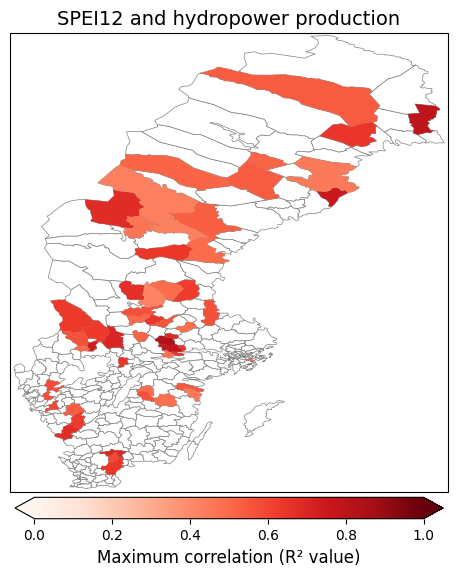

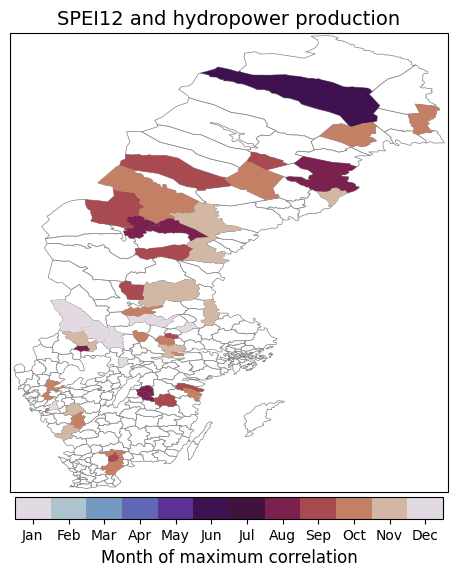

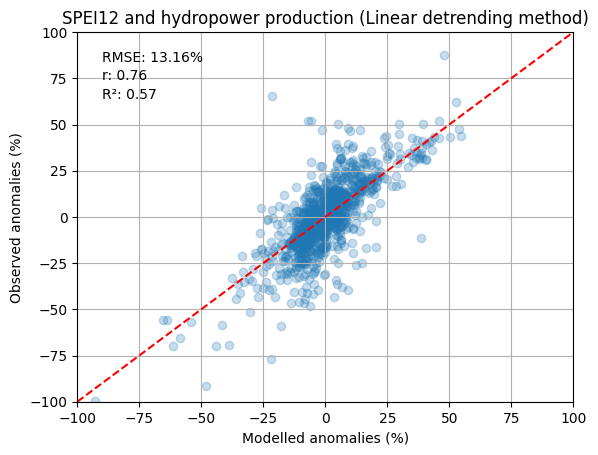

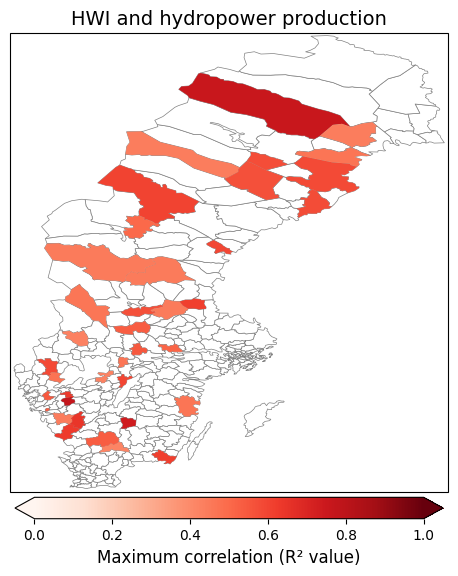

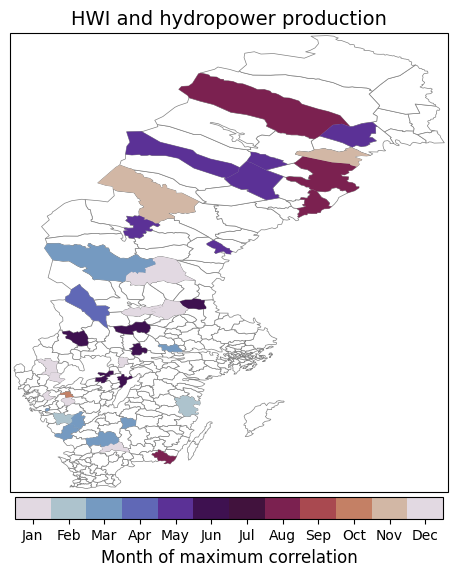

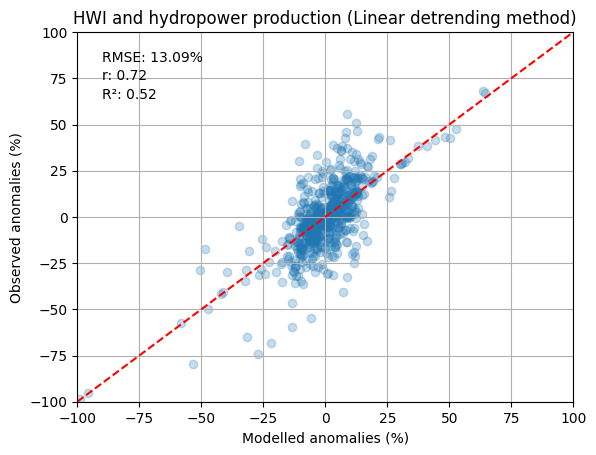

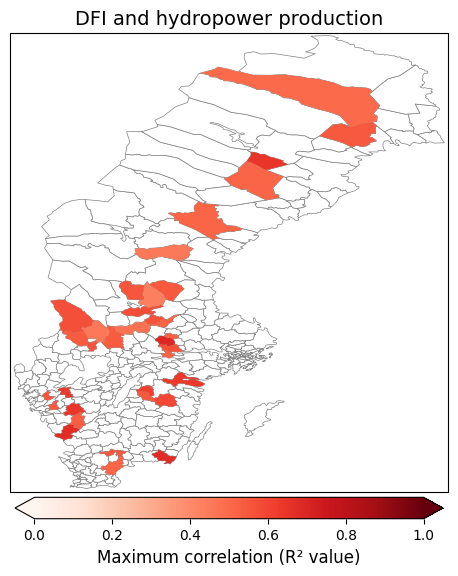

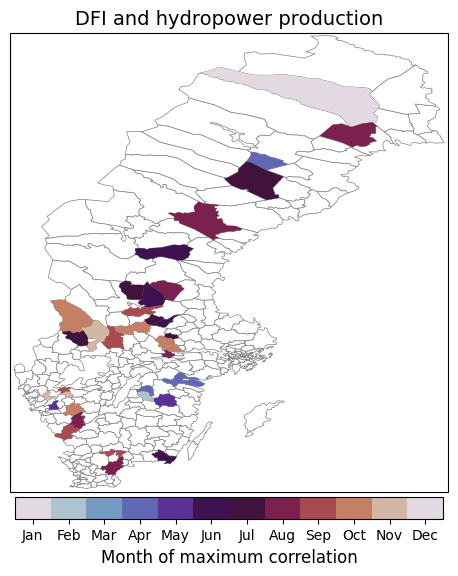

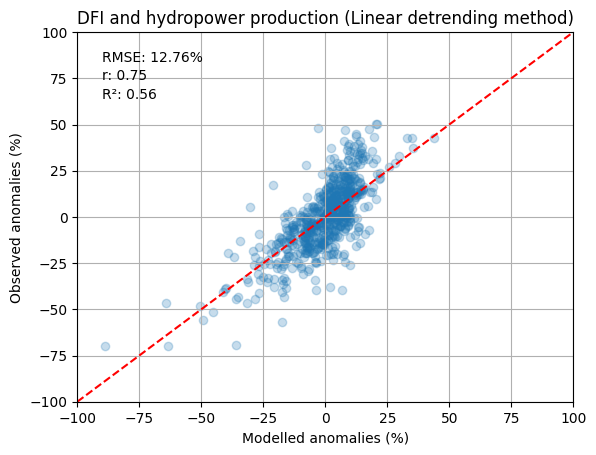

In [22]:
# Batch Runs - Energy
runs_df=pd.read_excel('Variable Runs Municipality.xlsx',
                         'Energy')
runs_df=runs_df.sort_values('hazard_var', ascending=False)
runs_df=runs_df[runs_df['Threshold Type']=='none']
all_corr_df=pd.DataFrame()
all_count_df=pd.DataFrame()
all_saved_data=pd.DataFrame()
trends=['Linear']
runs_df['Count']=np.nan
runs_df['Trend']=np.nan
runs_df['Median R2']=np.nan
runs_df['Aggregation']=1
runs_no_trend=runs_df.copy()
for trend in trends:
    runs_df_trend=runs_no_trend.copy()
    runs_df_trend['Trend']=trend
    runs_df = pd.concat([runs_df, runs_df_trend], ignore_index=True)
runs_df=runs_df.dropna(subset='Trend')
months=[2,3,4,5,6,7,8,9,10,11,12]
runs_no_month=runs_df.copy()
for month in months:
    runs_df_month=runs_no_month.copy()
    runs_df_month['Aggregation']=month
    runs_df = pd.concat([runs_df, runs_df_month], ignore_index=True)
window_frac=0.25 # For LOWESS only
for N in range(len(runs_df)):
    trend= runs_df['Trend'].iloc[N]
    var_imp= runs_df['impact_var'].iloc[N]
    var_haz= runs_df['hazard_var'].iloc[N]
    conversion= runs_df['Conversion'].iloc[N]
    threshold= runs_df['Threshold'].iloc[N]
    t_type= runs_df['Threshold Type'].iloc[N]
    #threshold=0
    agg_type= runs_df['Aggregation'].iloc[N]
    data=read_data(agg_type)
    #agg_type= 'mean'
    print('Hazard variable: '+var_haz)
    print('Impact variable: '+var_imp)
    print('Aggregation type: '+str(agg_type))
    print('Threshold type: '+str(t_type))
    print('Trend: '+str(trend))
    print('Threshold: '+str(threshold))
    corr_df, count_df, mean_r2, median_r2, count, saved_data = correlations(data, var_imp, var_haz, threshold, trend, agg_type)
    runs_df['Mean R2'].iloc[N]=mean_r2
    runs_df['Median R2'].iloc[N]=median_r2
    runs_df['Count'].iloc[N]=count # number of municipality with good results
    all_corr_df = pd.concat([all_corr_df, corr_df], ignore_index=True)
    all_saved_data = pd.concat([all_saved_data, saved_data], ignore_index=True)
    all_count_df = pd.concat([all_count_df, count_df], ignore_index=True)
runs_df.to_excel('Runs_energy_municipalities_months.xlsx')
all_saved_data.to_csv('Results_energy_municipalities_months.csv')
all_corr_df.to_excel('All_correlations_energy_municipalities_months.xlsx')
# Plot graphs of maximum correlations
max_df=pd.DataFrame()
max_df['R2 overall']=np.nan
max_df['RMSE overall']=np.nan
r_squared_list=[]
r_list=[]
p_list=[]
rmse_list=[]
hazvar_list=[]
impvar_list=[]
trend_list=[]
for trend in all_count_df['Trend'].unique():
    for hazvar in all_count_df['Hazard variable'].unique():
        for impvar in all_count_df['Impact variable'].unique():
            hazvar_list.append(hazvar)
            impvar_list.append(impvar)
            trend_list.append(trend)
           # Select all correlations for all municipalities and months by hazard pair and trend type 
            all_corr_df_var=all_corr_df[all_corr_df['Hazard variable']==hazvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Impact variable']==impvar]
            all_corr_df_var=all_corr_df_var[all_corr_df_var['Trend']==trend]
            # Find maximum correlations by month 
            max_corr_agg = all_corr_df_var.groupby(['Municipality','Impact variable', 'Hazard variable', 'Trend']).agg('max').reset_index()
            max_corr_agg = max_corr_agg[max_corr_agg['Correlation']>0]
            # Drop Aggregation Column from max_corr_agg
            max_corr_agg.drop(columns=['Aggregation', 'A', 'B', 'C', 'D', 'p'], inplace=True)
            # Merge max_corr_agg with all_corr_df based on Correlation and Municipality to obtain corresponding Aggregation with maximum correlation
            max_corr_agg = pd.merge(max_corr_agg, all_corr_df, on=['Municipality', 'Impact variable', 'Hazard variable', 'Correlation', 'Trend'], how='left')
            corr_gdf = pd.merge(kommun_shapefile, max_corr_agg, left_on='KnNamn', right_on='Municipality')
            # Next, retrieve yearly impacts based on month with highest correlation 
            max_data= pd.merge(max_corr_agg, all_saved_data, on=['Municipality', 'Impact variable', 'Hazard variable', 'Aggregation', 'Trend'], how='left')
            impvar_name=impact_info[impact_info['var']==impvar]['Variable Name'].values[0]
            hazvar_name=hazard_info[hazard_info['var']==hazvar]['Variable Name'].values[0]
            title= hazvar_name +' and ' + impvar_name.lower()
            plot_map(corr_gdf, 'Correlation', title, 'Maximum correlation (R² value)',
                     lower_bound=0, upper_bound=1, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_corrs')
            plot_map_months(corr_gdf, 'Aggregation', title, 'Month of maximum correlation',
                     lower_bound=1, upper_bound=13, 
                     vcenter=0, cmap_type='Reds', save='no', filename='r2_map_months')

            # Sample data
            predicted_anomalies = max_data['Predicted anomalies']
            observed_anomalies = max_data['Observed anomalies']
            
            # Step 1: Filter out anomalies that are too large or too low
            predicted_anomalies = np.where((predicted_anomalies > 100) | (predicted_anomalies < -100), np.nan, predicted_anomalies)
            observed_anomalies = np.where((observed_anomalies > 100) | (observed_anomalies < -100), np.nan, observed_anomalies)

            # Step 2: Create a mask for indices where both arrays are non-NaN
            valid_mask = ~np.isnan(predicted_anomalies) & ~np.isnan(observed_anomalies)

            # Step 3: Filter both arrays using the mask
            predicted_anomalies = predicted_anomalies[valid_mask]
            observed_anomalies = observed_anomalies[valid_mask]

            # Calculate mean root square error and R-squared
            r_squared = r2_score(observed_anomalies, predicted_anomalies)
            r_squared_list.append(r_squared)
            r, p_value = pearsonr(observed_anomalies, predicted_anomalies)
            r_list.append(r)
            p_list.append(p_value)
            #print("R-squared:", r_squared)
            mse = mean_squared_error(observed_anomalies, predicted_anomalies)
            rmse = np.sqrt(mse)
            rmse_list.append(rmse)
            # Define limits
            limit = (-100, 100)

            # Plot scatter with transparency
            plt.scatter(predicted_anomalies, observed_anomalies, alpha=0.25)
            plt.xlim(limit)
            plt.ylim(limit)
            plt.xlabel('Modelled anomalies (%)')
            plt.ylabel('Observed anomalies (%)')
            plt.title(title+' ('+trend+' detrending method)')
            # Plot diagonal line
            plt.plot(limit, limit, color='red', linestyle='--')

            # Add text boxes for mean root square error and R-squared
            plt.text(0.05, 0.95, f'RMSE: {rmse:.2f}%', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.90, f'r: {r:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.text(0.05, 0.85, f'R²: {r_squared:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
            plt.grid(True)
            plt.show()

# Save results
max_df['Impact variable']=impvar_list
max_df['Hazard variable']=hazvar_list
max_df['Trend']=trend_list
max_df['R2 overall']=r_squared_list
max_df['R overall']=r_list
max_df['RMSE overall']=rmse_list
max_df['p overall']=p_list
max_df.to_excel('Correlations_energy_municipalities_months.xlsx')

In [24]:
# Merge all results for plotting
import pandas as pd
import pandas as pd

# Load correlation data and concatenate
all_corr_df = pd.read_excel('All_correlations_energy_municipalities_months.xlsx')
all_corr_df = pd.concat([
    all_corr_df,
    pd.read_excel('All_correlations_water_municipalities_months.xlsx'),
    pd.read_excel('All_correlations_food_municipalities_months.xlsx')
], ignore_index=True)

# Load results data and concatenate
all_saved_data = pd.read_csv('Results_energy_municipalities_months.csv')
all_saved_data = pd.concat([
    all_saved_data,
    pd.read_csv('Results_water_municipalities_months.csv'),
    pd.read_csv('Results_food_municipalities_months.csv')
], ignore_index=True)

# Drop 'Unnamed: 0' columns
all_corr_df = all_corr_df.drop(columns=['Unnamed: 0'])
all_saved_data = all_saved_data.drop(columns=['Unnamed: 0'])

# Load impact and hazard info
impact_info = pd.read_excel('Variable List.xlsx', sheet_name='Impact')
hazard_info = pd.read_excel('Variable List.xlsx', sheet_name='Hazard')

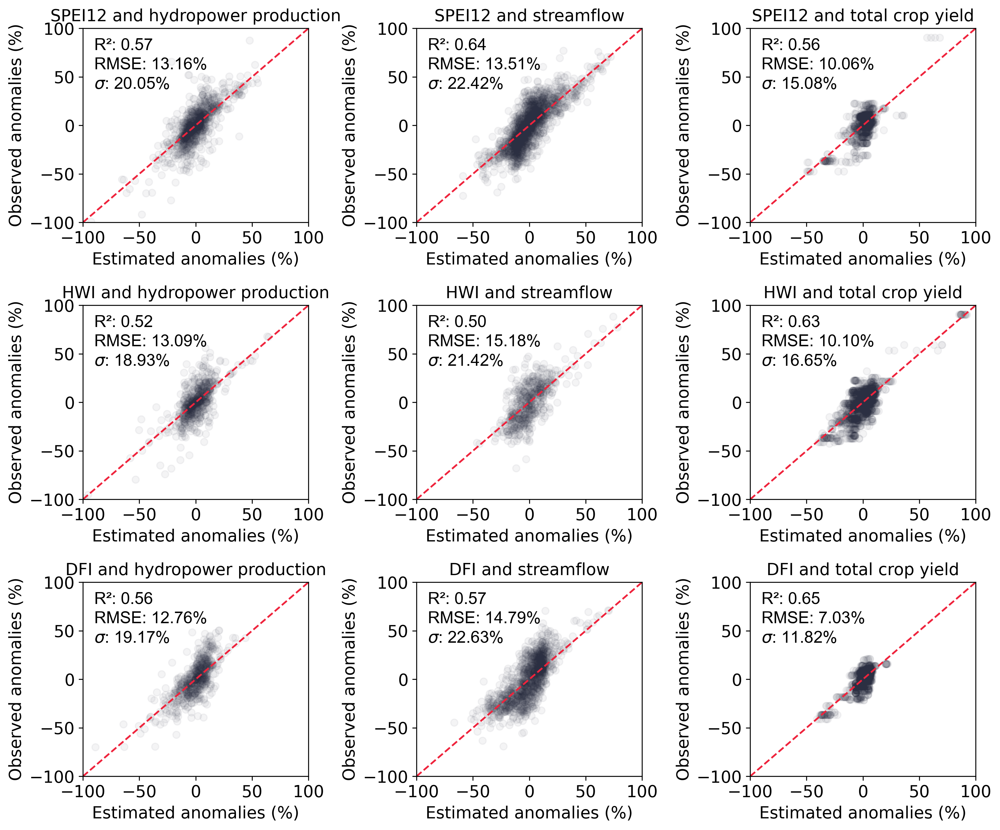

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import pearsonr
plt.rcdefaults()
def plot_associations(all_corr_df, impact_info, hazard_info, all_saved_data):
    fig, axes = plt.subplots(3, 3, figsize=(12, 10), dpi=300)
    axes = axes.flatten()  # Flatten the 2D array of axes for easier iteration

    # Set font properties for publication quality
    SIZE_DEFAULT = 14
    SIZE_LARGE = 14
    plt.rc("font", family="Arial")
    #plt.rc('font', serif='Helvetica Neue') 
    plt.rc("font", size=SIZE_DEFAULT)
    plt.rc("axes", titlesize=SIZE_LARGE)
    plt.rc("axes", labelsize=SIZE_LARGE)
    plt.rc("xtick", labelsize=SIZE_DEFAULT)
    plt.rc("ytick", labelsize=SIZE_DEFAULT)

    # Define a color palette
    colors = ["#2B2F42", "#EF233C", "#8D99AE"]

    # Initialize lists to store results
    r_squared_list = []

    rmse_list = []
    hazvar_list = []
    impvar_list = []
    trend_list = []

    # Detrending method
    trends = ['Linear']

    # Counter for subplot index
    plot_index = 0
    impvars = all_corr_df['Impact variable'].unique()
    impvars = impvars[impvars != 'groundwater']
    impvars = impvars[impvars != 'livestock']
    hazvars = all_corr_df['Hazard variable'].unique()

    for trend in trends:
        for hazvar in hazvars:
            for impvar in impvars:
                hazvar_list.append(hazvar)
                impvar_list.append(impvar)
                trend_list.append(trend)

                # Filter data for the specific hazard-impact pair and trend
                all_corr_df_var = all_corr_df[(all_corr_df['Hazard variable'] == hazvar) & 
                                              (all_corr_df['Impact variable'] == impvar) & 
                                              (all_corr_df['Trend'] == trend)]

                # Find maximum correlations by month
                max_corr_agg = all_corr_df_var.groupby(['Municipality', 'Impact variable', 'Hazard variable', 'Trend']).agg('max').reset_index()
                max_corr_agg = max_corr_agg[max_corr_agg['Correlation'] > 0]
                max_corr_agg = max_corr_agg.drop(columns=['Aggregation', 'A', 'B', 'C', 'D', 'ATE'], errors='ignore')
                max_corr_agg = pd.merge(max_corr_agg, all_corr_df, on=['Municipality', 'Impact variable', 'Hazard variable', 'Correlation', 'Trend'], how='left')

                corr_gdf = pd.merge(kommun_shapefile, max_corr_agg, left_on='KnNamn', right_on='Municipality')

                impvar_name = impact_info[impact_info['var'] == impvar]['Variable Name'].values[0]
                hazvar_name = hazard_info[hazard_info['var'] == hazvar]['Variable Name'].values[0]
                title = f'{hazvar_name} and {impvar_name.lower()}'

                # Retrieve data
                max_data = pd.merge(max_corr_agg, all_saved_data, on=['Municipality', 'Impact variable', 'Hazard variable', 'Aggregation', 'Trend'], how='left')
                predicted_anomalies = max_data['Predicted anomalies']
                observed_anomalies = max_data['Observed anomalies']

                # Filter anomalies
                predicted_anomalies = np.where((predicted_anomalies > 100) | (predicted_anomalies < -100), np.nan, predicted_anomalies)
                observed_anomalies = np.where((observed_anomalies > 100) | (observed_anomalies < -100), np.nan, observed_anomalies)

                # Create mask for valid data
                valid_mask = ~np.isnan(predicted_anomalies) & ~np.isnan(observed_anomalies)
                predicted_anomalies = predicted_anomalies[valid_mask]
                observed_anomalies = observed_anomalies[valid_mask]

                # Calculate RMSE and R-squared
                r_squared = r2_score(observed_anomalies, predicted_anomalies)
                #r, p_value = pearsonr(observed_anomalies, predicted_anomalies) # not suitable for nonlinear regression
                rmse = np.sqrt(mean_squared_error(observed_anomalies, predicted_anomalies))
                std = np.std(observed_anomalies)

                r_squared_list.append(r_squared)
                rmse_list.append(rmse)

                # Define plot limits
                limit = (-100, 100)

                # Plot scatter with transparency
                ax = axes[plot_index]
                ax.scatter(predicted_anomalies, observed_anomalies, alpha=0.05, color=colors[0])
                ax.plot(limit, limit, color=colors[1], linestyle='--', linewidth=1.5)

                # Set axis labels and title
                ax.set_xlim(limit)
                ax.set_ylim(limit)
                ax.set_xlabel('Estimated anomalies (%)', fontsize=SIZE_LARGE)
                ax.set_ylabel('Observed anomalies (%)', fontsize=SIZE_LARGE)
                ax.tick_params(axis='both', which='major', labelsize=SIZE_DEFAULT)
                ax.set_title(title)

                # Add text box for statistics
                ax.text(0.05, 0.95, f'R²: {r_squared:.2f}', transform=ax.transAxes, fontsize=SIZE_DEFAULT, verticalalignment='top')
                #ax.text(0.05, 0.85, f'r: {r:.2f}', transform=ax.transAxes, fontsize=SIZE_DEFAULT, verticalalignment='top')
                ax.text(0.05, 0.85, f'RMSE: {rmse:.2f}%', transform=ax.transAxes, fontsize=SIZE_DEFAULT, verticalalignment='top')
                ax.text(0.05, 0.75, f'$\sigma$: {std:.2f}%', transform=ax.transAxes, fontsize=SIZE_DEFAULT, verticalalignment='top')

                # Remove gridlines
                ax.grid(False)

                # Move to the next subplot
                plot_index += 1

    # Adjust layout and save figure
    plt.tight_layout()
    plt.savefig('fig_models.svg', dpi=300, bbox_inches='tight')
    plt.savefig('fig_models.pdf', dpi=300, bbox_inches='tight')
    plt.show()

plot_associations(all_corr_df, impact_info, hazard_info, all_saved_data)
